# Body signal of smoking

## 1. Data Preprocessing

#### 1.1 Importing packages and modules

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.preprocessing import LabelEncoder, MinMaxScaler, RobustScaler, StandardScaler
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

import time

#### 1.2 데이터 불러오기

In [92]:
smoking = pd.read_csv('../data/Smoking_raw/smoking.csv')
pd.set_option('display.max_columns',30)
smoking.head()

,ID,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,smoking
0,0,F,40,155,60,81.3,1.2,1.0,1.0,1.0,114.0,73.0,94.0,215.0,82.0,73.0,126.0,12.9,1.0,0.7,18.0,19.0,27.0,Y,0,Y,0
1,1,F,40,160,60,81.0,0.8,0.6,1.0,1.0,119.0,70.0,130.0,192.0,115.0,42.0,127.0,12.7,1.0,0.6,22.0,19.0,18.0,Y,0,Y,0
2,2,M,55,170,60,80.0,0.8,0.8,1.0,1.0,138.0,86.0,89.0,242.0,182.0,55.0,151.0,15.8,1.0,1.0,21.0,16.0,22.0,Y,0,N,1
3,3,M,40,165,70,88.0,1.5,1.5,1.0,1.0,100.0,60.0,96.0,322.0,254.0,45.0,226.0,14.7,1.0,1.0,19.0,26.0,18.0,Y,0,Y,0
4,4,F,40,155,60,86.0,1.0,1.0,1.0,1.0,120.0,74.0,80.0,184.0,74.0,62.0,107.0,12.5,1.0,0.6,16.0,14.0,22.0,Y,0,N,0


In [75]:
smoking.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55692 entries, 0 to 55691
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   55692 non-null  int64  
 1   gender               55692 non-null  object 
 2   age                  55692 non-null  int64  
 3   height(cm)           55692 non-null  int64  
 4   weight(kg)           55692 non-null  int64  
 5   waist(cm)            55692 non-null  float64
 6   eyesight(left)       55692 non-null  float64
 7   eyesight(right)      55692 non-null  float64
 8   hearing(left)        55692 non-null  float64
 9   hearing(right)       55692 non-null  float64
 10  systolic             55692 non-null  float64
 11  relaxation           55692 non-null  float64
 12  fasting blood sugar  55692 non-null  float64
 13  Cholesterol          55692 non-null  float64
 14  triglyceride         55692 non-null  float64
 15  HDL                  55692 non-null 

In [4]:
print("\nThere are totally {} null values in the dataset".format(smoking.isnull().sum().sum())) # for checking null counts


There are totally 0 null values in the dataset


#### 1.3 전처리 함수 생성

In [96]:
def preprocessing(df_scaling):
    # Remove columns not necessary
    if 'ID' in df_scaling:
        df_scaling = df_scaling.drop("ID", axis = 1)
        if len(df_scaling.columns) == 1:
            return df_scaling
        
        # Oral(=구강검사 여부) 특성값은 모두 Y 값이므로 삭제.
        df_scaling = df_scaling.drop('oral', axis = 1) 
        
        # Categorical features label encoding
        cate_features = df_scaling[['gender','tartar']]

        lbe = LabelEncoder()
        lbe.fit_transform(df_scaling["gender"])
        df_scaling["gender"] = lbe.fit_transform(df_scaling["gender"])

        lbe.fit_transform(df_scaling["tartar"])
        df_scaling["tartar"] = lbe.fit_transform(df_scaling["tartar"])
        
        # Urine protein categorizing
        x = df_scaling['Urine protein']
        for i in range(len(x)):
            if(x[i] == 1.0):
                x[i] = 0
            elif(x[i] == 2.0):
                x[i] = 1
            else:
                x[i] = 2
        df_scaling['Urine protein'] = x
        
        # hearing feature converting values 1, 2 => 1, 0
        df_scaling['hearing(left)'] = df_scaling['hearing(left)'].apply(lambda x: x-2 if x == 2.0 else x )
        df_scaling['hearing(right)'] = df_scaling['hearing(right)'].apply(lambda x: x-2 if x == 2.0 else x )
        
        # BMI 지수 계산 : bmi = kg/m^2
        df_scaling['bmi'] = df_scaling['weight(kg)']/((df_scaling['height(cm)']*0.01)**2)
        # wwi(비만 지수) 지수 계산 : wwi = cm/sqrt(kg)
        df_scaling['wwi'] = df_scaling['waist(cm)']/(df_scaling['weight(kg)'].apply(np.sqrt))

    return df_scaling

In [97]:
df = preprocessing(smoking)
df

,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,tartar,smoking,bmi,wwi
0,0,40,155,60,81.3,1.2,1.0,1.0,1.0,114.0,73.0,94.0,215.0,82.0,73.0,126.0,12.9,2.0,0.7,18.0,19.0,27.0,0,1,0,24.973985,10.495785
1,0,40,160,60,81.0,0.8,0.6,1.0,1.0,119.0,70.0,130.0,192.0,115.0,42.0,127.0,12.7,2.0,0.6,22.0,19.0,18.0,0,1,0,23.437500,10.457055
2,1,55,170,60,80.0,0.8,0.8,1.0,1.0,138.0,86.0,89.0,242.0,182.0,55.0,151.0,15.8,2.0,1.0,21.0,16.0,22.0,0,0,1,20.761246,10.327956
3,1,40,165,70,88.0,1.5,1.5,1.0,1.0,100.0,60.0,96.0,322.0,254.0,45.0,226.0,14.7,2.0,1.0,19.0,26.0,18.0,0,1,0,25.711662,10.518012
4,0,40,155,60,86.0,1.0,1.0,1.0,1.0,120.0,74.0,80.0,184.0,74.0,62.0,107.0,12.5,2.0,0.6,16.0,14.0,22.0,0,0,0,24.973985,11.102552
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55687,0,40,170,65,75.0,0.9,0.9,1.0,1.0,110.0,68.0,89.0,213.0,99.0,75.0,118.0,12.3,2.0,0.6,14.0,7.0,10.0,1,1,0,22.491349,9.302605
55688,0,45,160,50,70.0,1.2,1.2,1.0,1.0,101.0,62.0,89.0,166.0,69.0,73.0,79.0,14.0,2.0,0.9,20.0,12.0,14.0,0,1,0,19.531250,9.899495
55689,0,55,160,50,68.5,1.0,1.2,1.0,1.0,117.0,72.0,88.0,158.0,77.0,79.0,63.0,12.4,2.0,0.5,17.0,11.0,12.0,0,0,0,19.531250,9.687363
55690,1,60,165,60,78.0,0.8,1.0,1.0,1.0,133.0,76.0,107.0,210.0,79.0,48.0,146.0,14.4,2.0,0.7,20.0,19.0,18.0,0,0,0,22.038567,10.069757


In [12]:
# !pip install Jinja2

     -------------------------------------- 133.1/133.1 kB 4.0 MB/s eta 0:00:00


In [99]:
df.corr().style.background_gradient(cmap='magma')

,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,tartar,smoking,bmi,wwi
gender,1.000000,-0.290095,0.741556,0.574956,0.419568,0.127424,0.125680,0.009407,0.011579,0.167289,0.177891,0.098117,-0.085270,0.241520,-0.306728,-0.042525,0.702214,-0.018344,0.507249,0.095718,0.167903,0.237270,0.084408,0.055473,0.510340,0.213837,-0.145571
age,-0.290095,1.000000,-0.479528,-0.324706,-0.026297,-0.195472,-0.192723,-0.203993,-0.208722,0.134023,0.050745,0.182351,0.055557,0.015102,0.007047,0.043007,-0.263078,-0.001796,-0.106118,0.032576,-0.063937,0.013031,-0.114984,-0.081796,-0.162557,-0.063384,0.441249
height(cm),0.741556,-0.479528,1.000000,0.675656,0.378902,0.151133,0.155665,0.078663,0.078323,0.080585,0.113193,0.019619,-0.082161,0.156693,-0.213284,-0.048419,0.539367,-0.014173,0.383883,0.041737,0.126511,0.139720,0.079331,0.055513,0.396675,0.140233,-0.360712
weight(kg),0.574956,-0.324706,0.675656,1.000000,0.822842,0.108433,0.113155,0.050094,0.052836,0.266131,0.271634,0.136237,0.026403,0.324429,-0.358868,0.040560,0.492970,-0.024692,0.324808,0.120130,0.250634,0.209625,0.073536,0.059921,0.302780,0.819904,-0.057518
waist(cm),0.419568,-0.026297,0.378902,0.822842,1.000000,0.027458,0.037996,-0.023790,-0.019286,0.316922,0.292627,0.211132,0.065467,0.361922,-0.376203,0.072817,0.387066,-0.027654,0.235024,0.142690,0.252478,0.243141,0.044203,0.046197,0.226259,0.819226,0.514733
eyesight(left),0.127424,-0.195472,0.151133,0.108433,0.027458,1.000000,0.354574,0.046571,0.048788,-0.019330,0.005199,-0.041851,-0.004985,0.019717,-0.015296,-0.007257,0.095234,0.000524,0.071410,-0.007966,0.019326,0.003850,0.003684,0.012532,0.061204,0.029536,-0.116424
eyesight(right),0.125680,-0.192723,0.155665,0.113155,0.037996,0.354574,1.000000,0.043877,0.046623,-0.013720,0.011357,-0.044006,-0.007851,0.019881,-0.022220,-0.006172,0.096119,0.005771,0.047608,-0.006921,0.024182,0.012195,0.016359,0.006568,0.063017,0.031788,-0.105616
hearing(left),0.009407,-0.203993,0.078663,0.050094,-0.023790,0.046571,0.043877,1.000000,0.510095,-0.055219,-0.008754,-0.042314,0.023276,-0.004750,0.020159,0.016706,0.026116,0.006560,-0.003349,-0.018074,-0.004820,-0.012864,0.016100,0.035396,0.023209,0.004973,-0.119664
hearing(right),0.011579,-0.208722,0.078323,0.052836,-0.019286,0.048788,0.046623,0.510095,1.000000,-0.049095,-0.001651,-0.041339,0.023058,-0.000267,0.017986,0.015426,0.030943,0.011310,-0.008060,-0.009393,0.005081,-0.009245,0.016376,0.026698,0.018855,0.010095,-0.116827
systolic,0.167289,0.134023,0.080585,0.266131,0.316922,-0.019330,-0.013720,-0.055219,-0.049095,1.000000,0.761051,0.172700,0.059572,0.198826,-0.088487,0.016569,0.186514,-0.024746,0.072288,0.083204,0.094893,0.165724,0.029894,0.006542,0.073109,0.299640,0.158038


Competition Format

In [113]:
# competition_format
x_train = pd.read_csv('../data/Smoking_raw/competition_format/x_train.csv')
x_test = pd.read_csv('../data/Smoking_raw/competition_format/x_test.csv')
y_train = pd.read_csv('../data/Smoking_raw/competition_format/y_train.csv')
y_test = pd.read_csv('../data/Smoking_raw/competition_format/y_test.csv')

In [114]:
x_train = preprocessing(x_train)
x_test = preprocessing(x_test)
y_train = preprocessing(y_train) # remove 'ID', 'oral' columns
y_test = preprocessing(y_test) # remove 'ID', 'oral' columns

#### 1.4 Scaler 함수 생성

In [111]:
def scaling(train_data, test_data, scaled_form = 'MinMaxScaler()'):
    # 형태 별 특성 구분
    train_data = preprocessing(train_data)
    test_data = preprocessing(test_data)
    tr_cate_features = train_data[['gender', 'tartar', 'hearing(right)', 'hearing(left)', 'dental caries']]
    tr_scaled_features = train_data.drop(tr_cate_features.columns, axis=1)
    
    ts_cate_features = test_data[['gender', 'tartar', 'hearing(right)', 'hearing(left)', 'dental caries']]
    ts_scaled_features = test_data.drop(ts_cate_features.columns, axis=1)
    
    if scaled_form == 'StandardScaler()':
        # Standard scaler
        scaler = StandardScaler()
        scaler.fit(tr_scaled_features) # 훈련 데이터에 fit() 적용
        
        # 훈련 데이터와 테스트 데이터에 transform()을 통해 변환
        tr_scaled = scaler.transform(tr_scaled_features)
        ts_scaled = scaler.transform(ts_scaled_features)
        
        train_std_scaled = pd.DataFrame(tr_scaled, columns=tr_scaled_features.columns)
        train_std_scaled[tr_cate_features.columns] = tr_cate_features
        
        test_std_scaled = pd.DataFrame(ts_scaled, columns=ts_scaled_features.columns)
        test_std_scaled[ts_cate_features.columns] = ts_cate_features
        
        return train_std_scaled, test_std_scaled
    
    elif scaled_form == 'RobustScaler()':
        # Robust scaler
        scaler = RobustScaler()
        scaler.fit(tr_scaled_features) # 훈련 데이터에 fit() 적용
        
        # 훈련 데이터와 테스트 데이터에 transform()을 통해 변환
        tr_scaled = scaler.transform(tr_scaled_features)
        ts_scaled = scaler.transform(ts_scaled_features)
        
        # 데이터 프레임 형태로 변환
        train_robust_scaled = pd.DataFrame(tr_scaled, columns=tr_scaled_features.columns)
        train_robust_scaled[tr_cate_features.columns] = tr_cate_features
        
        test_robust_scaled = pd.DataFrame(ts_scaled, columns=ts_scaled_features.columns)
        test_robust_scaled[ts_cate_features.columns] = ts_cate_features
        
        return train_robust_scaled, test_robust_scaled
        
    elif scaled_form == 'logScaler' :
        # log scaler
        tr_scaled = np.log1p(tr_scaled_features)
        ts_scaled = np.log1p(ts_scaled_features)
        
        # 데이터 프레임 형태로 변환
        train_log_scaled = pd.DataFrame(tr_scaled, columns = tr_scaled_features.columns)
        train_log_scaled[tr_cate_features.columns] = tr_cate_features
        
        test_log_scaled = pd.DataFrame(ts_scaled,columns = ts_scaled_features.columns)
        test_log_scaled[ts_cate_features.columns] = ts_cate_features 
        
        return train_log_scaled, test_log_scaled
    
    else:
        # MinMax scaler
        scaler = MinMaxScaler()
        scaler.fit(tr_scaled_features) # 훈련 데이터에 fit() 적용
        
        # 훈련 데이터와 테스트 데이터에 transform()을 통해 변환
        tr_scaled = scaler.transform(tr_scaled_features)
        ts_scaled = scaler.transform(ts_scaled_features)
        
        # 데이터 프레임 형태로 변환
        train_mmx_scaled = pd.DataFrame(tr_scaled, columns = tr_scaled_features.columns)
        train_mmx_scaled[tr_cate_features.columns] = tr_cate_features
        
        test_mmx_scaled = pd.DataFrame(ts_scaled,columns = ts_scaled_features.columns)
        test_mmx_scaled[ts_cate_features.columns] = ts_cate_features

        return train_mmx_scaled, test_mmx_scaled

In [18]:
# x_train, x_test = scaling(x_train, x_test, 'StandardScaler()')
# x_train, x_test = scaling(x_train, x_test, 'RobustScaler()')
x_train, x_test = scaling(x_train, x_test, 'logScaler')
# x_train, x_test = scaling(x_train, x_test)

In [19]:
x_train

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,bmi,wwi,gender,tartar,hearing(right),hearing(left),dental caries
0,0.307692,0.416667,0.285714,0.388462,0.112245,0.091837,0.254438,0.311321,0.104575,0.410256,0.074672,0.112378,0.067240,0.493827,0.0,0.052174,0.009195,0.006179,0.026052,0.379885,0.447066,0,1,1.0,1.0,0.0
1,0.307692,0.500000,0.285714,0.384615,0.071429,0.051020,0.284024,0.283019,0.183007,0.351282,0.107972,0.061889,0.067778,0.481481,0.0,0.043478,0.012261,0.006179,0.017034,0.325362,0.442914,0,1,1.0,1.0,0.0
2,0.538462,0.666667,0.285714,0.371795,0.071429,0.071429,0.396450,0.433962,0.093682,0.479487,0.175580,0.083062,0.080689,0.672840,0.0,0.078261,0.011494,0.005149,0.021042,0.230392,0.429073,1,0,1.0,1.0,0.0
3,0.307692,0.583333,0.380952,0.474359,0.142857,0.142857,0.171598,0.188679,0.108932,0.684615,0.248234,0.066775,0.121033,0.604938,0.0,0.078261,0.009962,0.008582,0.017034,0.406062,0.449449,1,1,1.0,1.0,0.0
4,0.307692,0.416667,0.285714,0.448718,0.091837,0.091837,0.289941,0.320755,0.074074,0.330769,0.066599,0.094463,0.057020,0.469136,0.0,0.043478,0.007663,0.004463,0.021042,0.379885,0.512118,0,0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44548,0.461538,0.666667,0.333333,0.474359,0.112245,0.112245,0.455621,0.509434,0.122004,0.325641,0.161453,0.058632,0.057558,0.635802,0.0,0.078261,0.029885,0.016478,0.050100,0.291787,0.492016,1,1,1.0,1.0,0.0
44549,0.230769,0.750000,0.380952,0.423077,0.051020,0.061224,0.201183,0.320755,0.091503,0.338462,0.052472,0.086319,0.062937,0.635802,0.0,0.069565,0.010728,0.004463,0.015030,0.304767,0.398193,1,1,1.0,1.0,0.0
44550,0.230769,0.750000,0.380952,0.255128,0.142857,0.142857,0.266272,0.283019,0.106754,0.230769,0.050454,0.060261,0.048951,0.524691,0.0,0.078261,0.009195,0.006179,0.009018,0.304767,0.230330,1,1,1.0,1.0,0.0
44551,0.461538,0.583333,0.571429,0.715385,0.071429,0.040816,0.301775,0.330189,0.098039,0.317949,0.132190,0.070033,0.055406,0.592593,0.0,0.069565,0.018391,0.016478,0.039078,0.666748,0.528752,1,1,1.0,1.0,0.0


In [20]:
x_test

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,bmi,wwi,gender,tartar,hearing(right),hearing(left),dental caries
0,0.923077,0.500000,0.333333,0.512821,0.081633,0.061224,0.289941,0.377358,0.143791,0.292308,0.059536,0.092834,0.050027,0.592593,0.0,0.078261,0.017625,0.006179,0.038076,0.394670,0.531910,1,0,1.0,1.0,0.0
1,0.153846,0.583333,0.571429,0.602564,0.142857,0.142857,0.384615,0.405660,0.108932,0.482051,0.092836,0.087948,0.088219,0.660494,0.0,0.069565,0.010728,0.012358,0.033066,0.666748,0.429304,1,0,1.0,1.0,0.0
2,0.307692,0.666667,0.428571,0.384615,0.142857,0.142857,0.396450,0.433962,0.100218,0.276923,0.208880,0.053746,0.052179,0.709877,0.0,0.052174,0.014559,0.010642,0.072144,0.414575,0.324557,1,0,1.0,1.0,0.0
3,0.230769,0.750000,0.380952,0.371795,0.091837,0.091837,0.526627,0.566038,0.117647,0.494872,0.168517,0.079805,0.085530,0.641975,0.0,0.052174,0.018391,0.018538,0.049098,0.304767,0.346937,1,0,1.0,1.0,0.0
4,0.230769,0.500000,0.428571,0.538462,0.091837,0.112245,0.319527,0.377358,0.154684,0.405128,0.105954,0.087948,0.070468,0.604938,0.0,0.086957,0.022222,0.019567,0.055110,0.533286,0.473111,1,0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11134,0.307692,0.666667,0.333333,0.307692,0.081633,0.081633,0.230769,0.264151,0.093682,0.405128,0.091826,0.115635,0.062937,0.456790,0.0,0.043478,0.006130,0.002060,0.009018,0.291787,0.319146,0,1,1.0,1.0,1.0
11135,0.384615,0.500000,0.190476,0.243590,0.112245,0.112245,0.177515,0.207547,0.093682,0.284615,0.061554,0.112378,0.041958,0.561728,0.0,0.069565,0.010728,0.003776,0.013026,0.186745,0.383138,0,1,1.0,1.0,0.0
11136,0.538462,0.500000,0.190476,0.224359,0.091837,0.112245,0.272189,0.301887,0.091503,0.264103,0.069627,0.122150,0.033351,0.462963,0.0,0.034783,0.008429,0.003433,0.011022,0.186745,0.360396,0,0,1.0,1.0,0.0
11137,0.615385,0.583333,0.285714,0.346154,0.071429,0.091837,0.366864,0.339623,0.132898,0.397436,0.071645,0.071661,0.077999,0.586420,0.0,0.052174,0.010728,0.006179,0.017034,0.275719,0.401392,1,0,1.0,1.0,0.0


array([[<AxesSubplot: title={'center': 'age'}>,
        <AxesSubplot: title={'center': 'height(cm)'}>,
        <AxesSubplot: title={'center': 'weight(kg)'}>,
        <AxesSubplot: title={'center': 'waist(cm)'}>,
        <AxesSubplot: title={'center': 'eyesight(left)'}>],
       [<AxesSubplot: title={'center': 'eyesight(right)'}>,
        <AxesSubplot: title={'center': 'systolic'}>,
        <AxesSubplot: title={'center': 'relaxation'}>,
        <AxesSubplot: title={'center': 'fasting blood sugar'}>,
        <AxesSubplot: title={'center': 'Cholesterol'}>],
       [<AxesSubplot: title={'center': 'triglyceride'}>,
        <AxesSubplot: title={'center': 'HDL'}>,
        <AxesSubplot: title={'center': 'LDL'}>,
        <AxesSubplot: title={'center': 'hemoglobin'}>,
        <AxesSubplot: title={'center': 'Urine protein'}>],
       [<AxesSubplot: title={'center': 'serum creatinine'}>,
        <AxesSubplot: title={'center': 'AST'}>,
        <AxesSubplot: title={'center': 'ALT'}>,
        <AxesSu

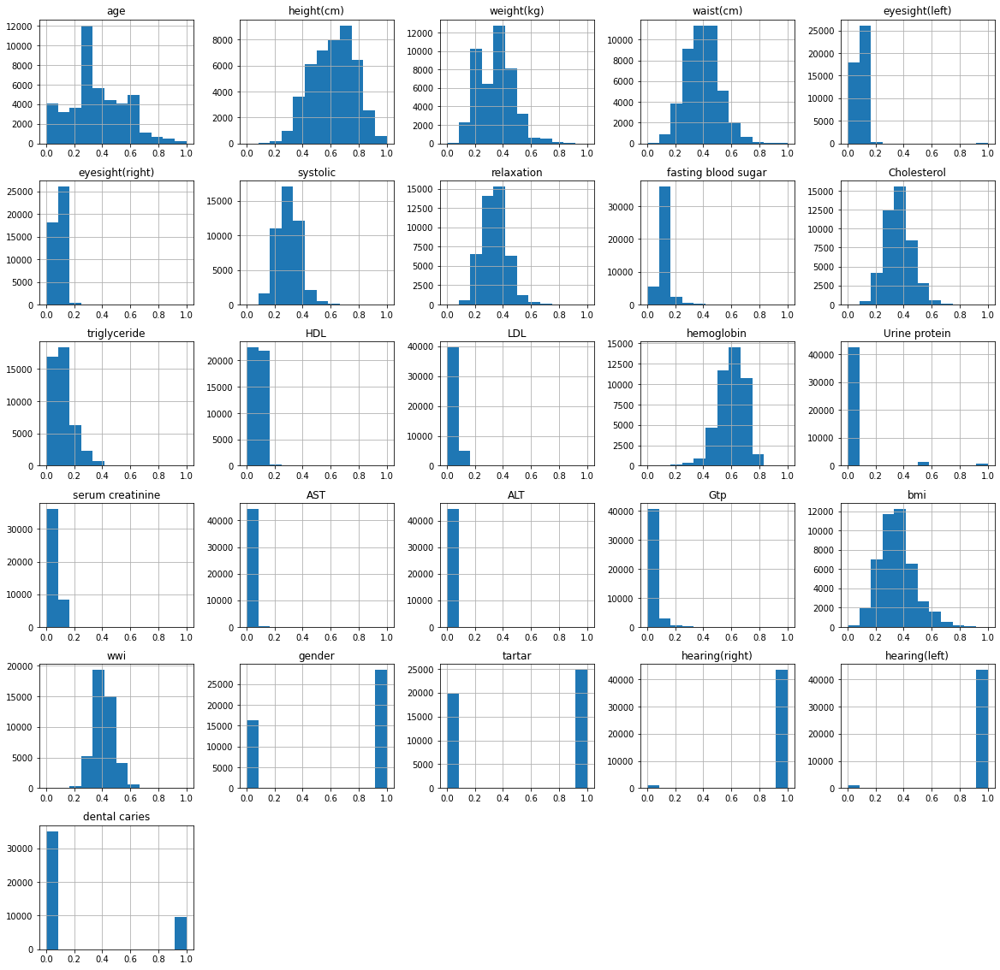

In [21]:
# x_train 시각화
x_train.hist(figsize = (20, 20), bins = 12, legend=False)

array([[<AxesSubplot: title={'center': 'age'}>,
        <AxesSubplot: title={'center': 'height(cm)'}>,
        <AxesSubplot: title={'center': 'weight(kg)'}>,
        <AxesSubplot: title={'center': 'waist(cm)'}>,
        <AxesSubplot: title={'center': 'eyesight(left)'}>],
       [<AxesSubplot: title={'center': 'eyesight(right)'}>,
        <AxesSubplot: title={'center': 'systolic'}>,
        <AxesSubplot: title={'center': 'relaxation'}>,
        <AxesSubplot: title={'center': 'fasting blood sugar'}>,
        <AxesSubplot: title={'center': 'Cholesterol'}>],
       [<AxesSubplot: title={'center': 'triglyceride'}>,
        <AxesSubplot: title={'center': 'HDL'}>,
        <AxesSubplot: title={'center': 'LDL'}>,
        <AxesSubplot: title={'center': 'hemoglobin'}>,
        <AxesSubplot: title={'center': 'Urine protein'}>],
       [<AxesSubplot: title={'center': 'serum creatinine'}>,
        <AxesSubplot: title={'center': 'AST'}>,
        <AxesSubplot: title={'center': 'ALT'}>,
        <AxesSu

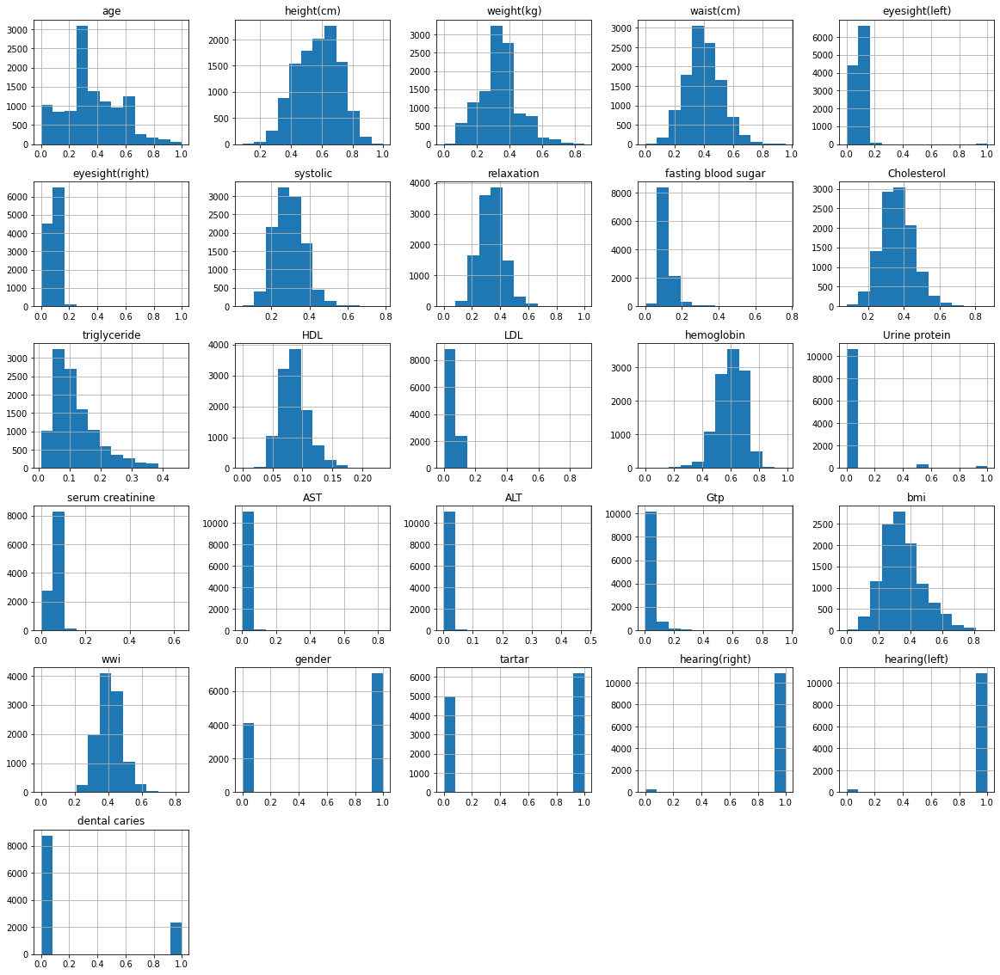

In [23]:
# x_test 시각화
x_test.hist(figsize = (20, 20), bins = 12, legend=False)

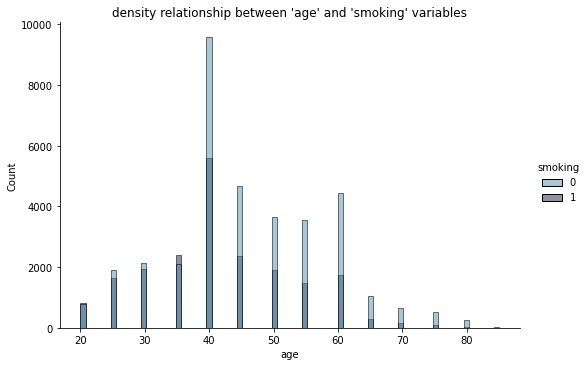

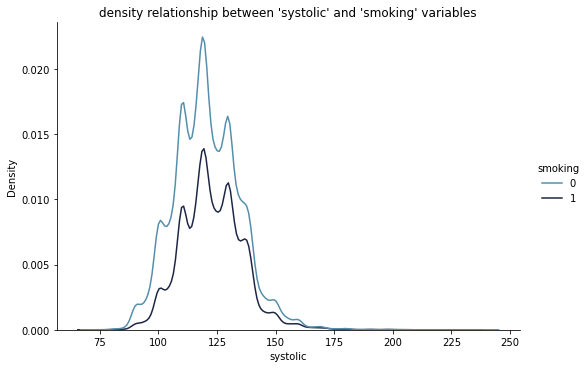

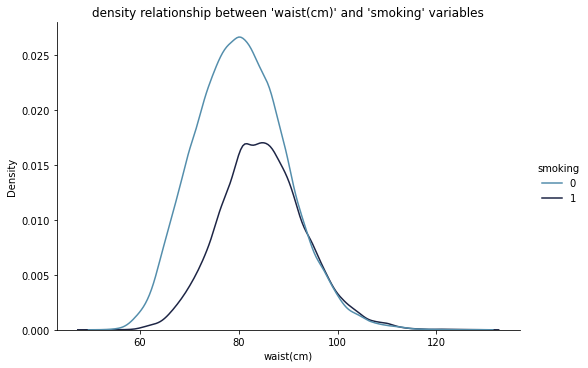

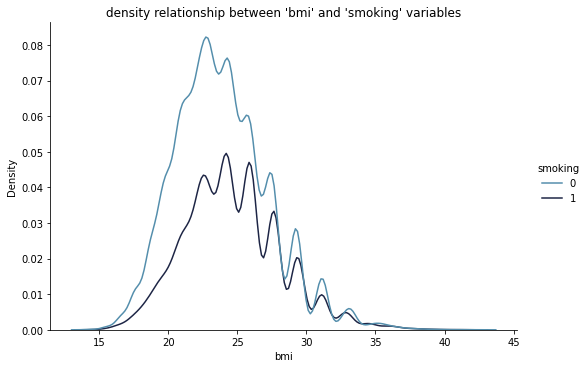

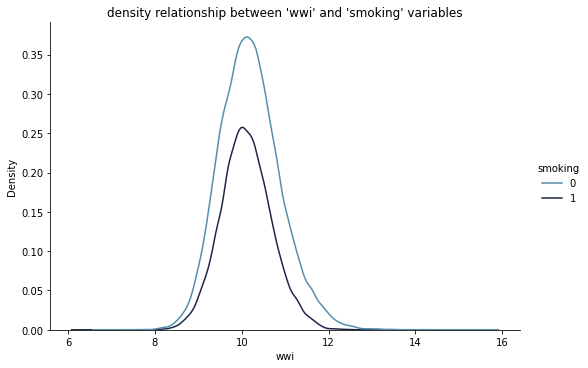

In [24]:
sns.displot(
    data = df, x = "age", hue = "smoking",
    kind = "hist", height = 5, aspect = 1.5,
    palette="ch:rot=-.25,hue=1,light=.50").set(title =  "density relationship between 'age' and 'smoking' variables");


sns.displot(
    data = df, x = "systolic", hue = "smoking",
    kind = "kde", height = 5, aspect = 1.5,
    palette="ch:rot=-.25,hue=1,light=.50").set(title = "density relationship between 'systolic' and 'smoking' variables");


sns.displot(
    data = df, x = "waist(cm)", hue = "smoking",
    kind = "kde", height = 5, aspect = 1.5, 
    palette="ch:rot=-.25,hue=1,light=.50").set(title = "density relationship between 'waist(cm)' and 'smoking' variables");

sns.displot(
    data = df, x = "bmi", hue = "smoking",
    kind = "kde", height = 5, aspect = 1.5,
    palette="ch:rot=-.25,hue=1,light=.50").set(title = "density relationship between 'bmi' and 'smoking' variables");

sns.displot(
    data = df, x = "wwi", hue = "smoking",
    kind = "kde", height = 5, aspect = 1.5,
    palette="ch:rot=-.25,hue=1,light=.50").set(title = "density relationship between 'wwi' and 'smoking' variables");

**Baseline : Random Forest**

In [103]:
from sklearn.ensemble import RandomForestClassifier # for modeling
from sklearn.metrics import accuracy_score, precision_score , recall_score

# 랜덤포레스트 객체 생성
rf_clf = RandomForestClassifier(random_state=0, n_estimators=2000)
rf_clf.fit(x_train, y_train)
rf_pred = rf_clf.predict(x_test)
rf_acc = accuracy_score(y_test, rf_pred)
rf_pred_probs = rf_clf.predict_proba(x_test)[:, 1]
print('랜덤 포레스트 정확도: {0:.4f}'.format(rf_acc))

랜덤 포레스트 정확도: 1.0000


In [107]:
rf_pred_probs = rf_clf.predict_proba(x_test)[:, 1]

In [109]:
def get_clf_eval(y_test, pred=None, pred_proba=None):
    confusion = confusion_matrix(y_test,pred)
    accuracy = accuracy_score(y_test,pred)
    precision = precision_score(y_test,pred)
    recall = recall_score(y_test,pred)
    f1 = f1_score(y_test,pred)
    # ROC-AUC 추가 
    roc_auc = roc_auc_score(y_test,pred_proba)
    print('오차 행렬')
    print(confusion)
    # ROC-AUC print 추가
    print('정확도: {0:.4f}, 정밀도: {1:.4f}, 재현율: {2:.4f},\
    F1: {3:.4f}, AUC:{4:.4f}'.format(accuracy, precision, recall, f1, roc_auc))

In [110]:
get_clf_eval(y_test, rf_pred, rf_pred_probs)

오차 행렬
[[7036    0]
 [   0 4103]]
정확도: 1.0000, 정밀도: 1.0000, 재현율: 1.0000,    F1: 1.0000, AUC:1.0000


## 2. XGBoost

#### General parameter
- booster
    - gbtree(tree based model) 또는 gblinear(linear model) 중 선택
    - Default = 'gbtree'
- silent
    - 출력 메시지 설정 관련 인수(나타내고 싶지 않을 경우 1로 설정)
    - Default = 1
- nthread
    - CPU 실행 스레드 개수 조정
    - Default는 전체 다 사용하는 것
    - 멀티코어/스레드 CPU 시스템에서 일부CPU만 사용할 때 변경

#### Boost Parameter
- eta: Learning rate (일반적으로 0.01 - 0.2)
    - 범위는 0 ~ 1로 클 수록 모형의 업데이트 속도는 빨라지지만, 과적합의 이슈 발생 가능성이 높음
- min_child_weight: min_child_weight를 기준으로 추가 분기 결정 (크면 Underfitting)
    - Default : 1
    - leaf node에 포함되는 최소 관측치의 수를 의미
    - 작은 값을 가질수록 과적합 발생 가능성이 높음 (과적합 조절 용도로 사용됨)
    - 범위: 0 ~ ∞
- max_depth: Tree 깊이 수
    - Default : 6
    - 트리의 최대 깊이를 설정
    - 0 을 지정하면 깊이의 제한이 없음
    - 과적합에 가장 민감하게 작용하는 파라미터 중 하나임 (과적합 조절 용도로 사용됨)
    - 범위: 0 ~ ∞
- max_leaf_node: 하나의 트리에서 node 개수
- gamma: split 하기 위한 최소의 loss 감소 정의
    - Default : 0
    - leaf node의 추가 분할을 결정할 최소손실 감소값
    - 해당 값보다 손실이 크게 감소할 때 분리
    - 값이 클수록 과적합 감소효과
    - 범위: 0 ~ ∞
- subsample
    - Default : 1
    - 학습 시 데이터 샘플링 비율을 지정(과적합 제어)
    - 일반적으로 0.5 ~ 1 사이의 값을 사용
    - 범위: 0 ~ 1
- colsample_bytree
    - Default : 1
    - 트리 생성에 필요한 feature의 샘플링에 사용
    - feature가 많을 때 과적합 조절에 사용
    - 범위: 0 ~ 1
- colsample_bylevel: 각 level마다 샘플링 비율
- lambda
    - Default : 1
    - L2 Regularization 적용 값
    - feature 개수가 많을 때 적용 검토
    - 클수록 과적합 감소 효과
- alpha: L1 norm
    - Default : 0
    - L1 Regularization 적용 값
    - feature 개수가 많을 때 적용 검토
    - 클수록 과적합 감소 효과

- scale_pos_weight: positive, negative weight 지정
    - Default : 1
    - 불균형 데이터셋의 균형을 유지

#### Train parameter
- objective	
    - reg:linear : 회귀
    - binary:logistic : 이진분류
    - multi:softmax : 다중분류, 클래스 반환
    - multi:softprob : 다중분류, 확률반환
- eval_metric : 검증에 사용되는 함수정의, 회귀 분석인 경우 'rmse'를, 클래스 분류 문제인 경우 'error'
    - rmse : Root Mean Squared Error
    - mae : mean absolute error
    - logloss : Negative log-likelihood
    - error : binary classification error rate
    - merror : multiclass classification error rate
    - mlogloss: Multiclass logloss
    - auc: Area Under Curve
- seed

### 2.1 Python wrapper를 사용한 XGB 모델

#### 2.1.1 DMarix 형태로 변환 후 분류기 생성

In [25]:
# !pip install xgboost

     -------------------------------------- 125.4/125.4 MB 9.0 MB/s eta 0:00:00


In [25]:
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn.metrics import confusion_matrix, auc
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import f1_score, roc_auc_score, roc_curve

# adjusting data into DMatirx type
dtrain = xgb.DMatrix(data=x_train,label=y_train,feature_names=x_train.columns)
dtest = xgb.DMatrix(data=x_test,label=y_test,feature_names=x_train.columns)

In [26]:
params = {'eta':0.1, # XGBClassifier일 경우 learning_rate 로 쓴다
          'objective':'binary:logistic', #목적함수 : 0 or 1 이므로 이진 로지스틱 사용
          'eval_metric':'logloss', # 오류 함수의 평가 성능 지표 : logloss
          'early_stoppings':100, #100회이상 시행시에도 오류가 내려가지않으면 중단
          'silent' : 0,
          'verbosity':0} # 트리 깊이 최대 3 , 학습률 0.1 , 

num_rounds = 200 # default : 100

In [27]:
wlist = [(dtrain,'train'),(dtest,'eval')]
start = time.time()
xgb_model = xgb.train(params = params,dtrain=dtrain,num_boost_round= num_rounds,
                      early_stopping_rounds=100,evals = wlist)
end = time.time()
print("XGB 수행 시간: {0:.1f} 초 ".format(end - start)) # 3.5 sec
pred_probs = xgb_model.predict(dtest)
preds = [1 if x > 0.5 else 0 for x in pred_probs]
print('분류 결과 : {0:.1f} '.format(accuracy_score(y_test,preds)))

[0]	train-logloss:0.65857	eval-logloss:0.65794
[1]	train-logloss:0.62994	eval-logloss:0.62888
[2]	train-logloss:0.60586	eval-logloss:0.60428
[3]	train-logloss:0.58568	eval-logloss:0.58370
[4]	train-logloss:0.56833	eval-logloss:0.56601
[5]	train-logloss:0.55341	eval-logloss:0.55083
[6]	train-logloss:0.54039	eval-logloss:0.53766
[7]	train-logloss:0.52910	eval-logloss:0.52611
[8]	train-logloss:0.51928	eval-logloss:0.51616
[9]	train-logloss:0.51068	eval-logloss:0.50736
[10]	train-logloss:0.50292	eval-logloss:0.49941
[11]	train-logloss:0.49610	eval-logloss:0.49251
[12]	train-logloss:0.49020	eval-logloss:0.48650
[13]	train-logloss:0.48483	eval-logloss:0.48110
[14]	train-logloss:0.47989	eval-logloss:0.47605
[15]	train-logloss:0.47558	eval-logloss:0.47166
[16]	train-logloss:0.47178	eval-logloss:0.46779
[17]	train-logloss:0.46826	eval-logloss:0.46426
[18]	train-logloss:0.46510	eval-logloss:0.46101
[19]	train-logloss:0.46212	eval-logloss:0.45790
[20]	train-logloss:0.45958	eval-logloss:0.45532
[2

#### 2.1.2 평가지표 시각화(오차행렬, ROC curve)

In [28]:
def get_clf_eval(y_test, pred=None, pred_proba=None):
    confusion = confusion_matrix(y_test,pred)
    accuracy = accuracy_score(y_test,pred)
    precision = precision_score(y_test,pred)
    recall = recall_score(y_test,pred)
    f1 = f1_score(y_test,pred)
    # ROC-AUC 추가 
    roc_auc = roc_auc_score(y_test,pred_proba)
    print('오차 행렬')
    print(confusion)
    # ROC-AUC print 추가
    print('정확도: {0:.4f}, 정밀도: {1:.4f}, 재현율: {2:.4f},\
    F1: {3:.4f}, AUC:{4:.4f}'.format(accuracy, precision, recall, f1, roc_auc))

In [29]:
get_clf_eval(y_test, preds, pred_probs)

오차 행렬
[[5980 1056]
 [ 894 3209]]
정확도: 0.8249, 정밀도: 0.7524, 재현율: 0.7821,    F1: 0.7670, AUC:0.9106


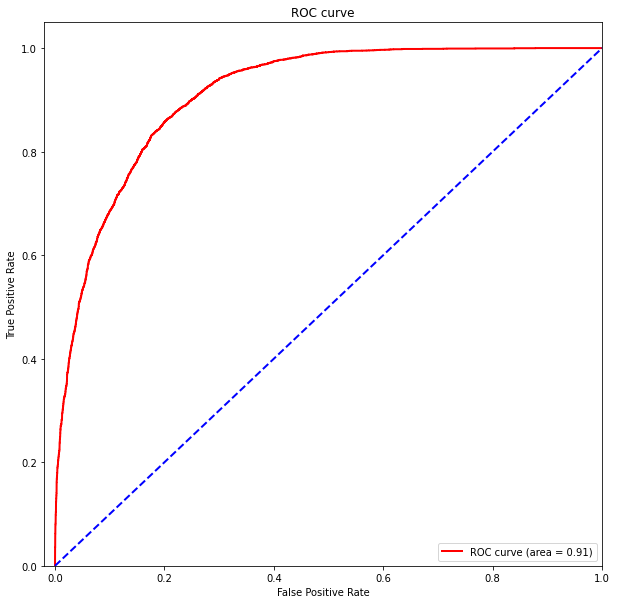

In [30]:
# Compute micro-average ROC curve and ROC area
fpr, tpr, _ = roc_curve(y_test.values, pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10,10))
lw = 2
plt.plot(fpr, tpr, color='red',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='blue', lw=lw, linestyle='--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right")
plt.show()

<AxesSubplot: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

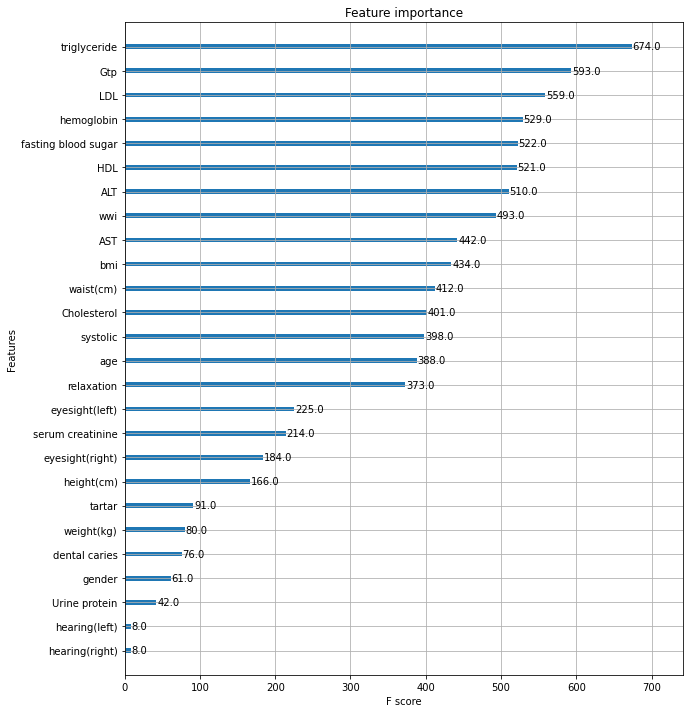

In [31]:
fig, ax = plt.subplots(figsize=(10,12)) # 축 반환
plot_importance(xgb_model,ax=ax)

In [39]:
# !pip install graphviz

  Using cached graphviz-0.20.1-py3-none-any.whl (47 kB)


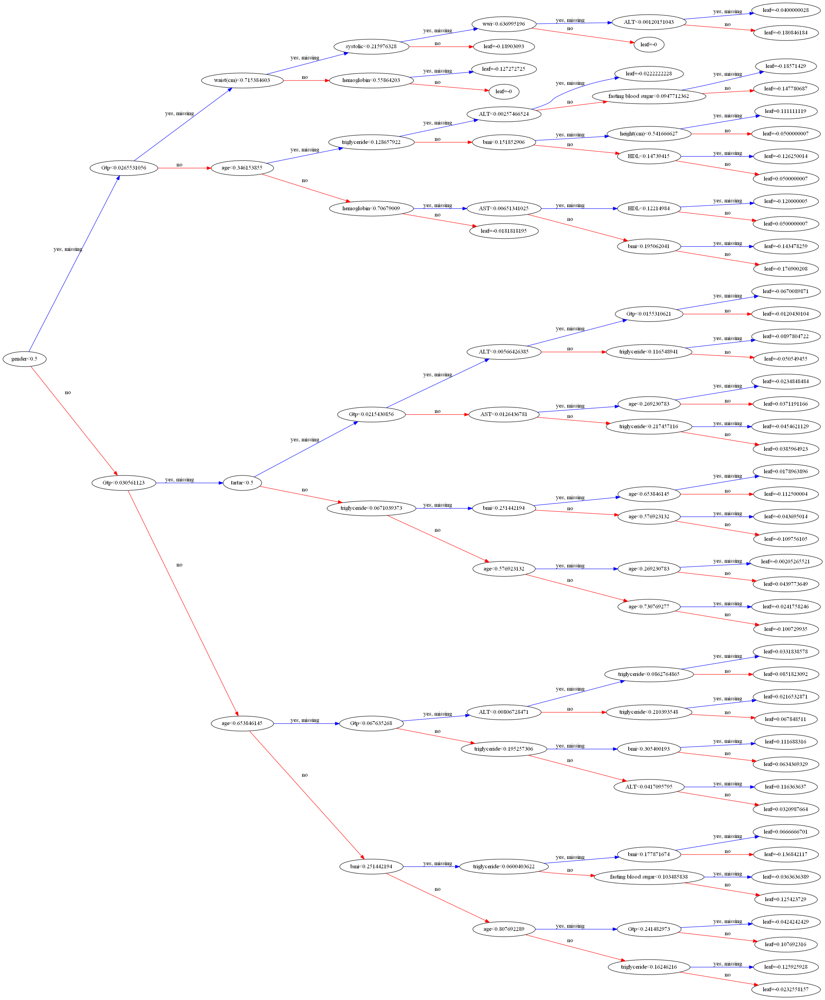

In [32]:
# num_trees : 그림을 여러개 그릴시 그림 번호
# rankdir : 트리의 방향, 디폴트는 위아래 방향
# rankdir="LR" : 왼쪽에서 오른쪽 방향으로 트리를 보여준다.
xgb.plot_tree(xgb_model, num_trees=0, rankdir='LR')

fig = plt.gcf()
fig.set_size_inches(150, 100)

# 이미지 저장하고 싶다면
# fig.savefig('xgb_tree_py_wp.png')

plt.show()

In [ ]:
# num_rounds의 횟수를 증가

### 2.2 Scikit-leran wrapper를 사용한 XGB 모델

#### 2.2.1 분류기 생성

In [41]:
# # Initiate XGBoost Classifier
# xgb_clf = XGBClassifier(learning_rate=0.1,n_estimators=2000,max_depth=3,
#                         silent=True,
#                         objective='binary:logistic',
#                         booster='gbtree',
#                         n_jobs=1,
#                         nthread=None,
#                         gamma=0,
#                         min_child_weight=1,
#                         max_delta_step=0,
#                         subsample=1,
#                         colsample_bytree=1,
#                         colsample_bylevel=1,
#                         reg_alpha=0,
#                         reg_lambda=1,
#                         scale_pos_weight=1,
#                         base_score=0.5,
#                         random_state=0,
#                         seed=None,
#                         missing=None)
# # Print default setting
# xgb_clf.get_params()

{'objective': 'binary:logistic',
 'use_label_encoder': False,
 'base_score': 0.5,
 'booster': 'gbtree',
 'callbacks': None,
 'colsample_bylevel': 1,
 'colsample_bynode': None,
 'colsample_bytree': 1,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'gamma': 0,
 'gpu_id': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': 0.1,
 'max_bin': None,
 'max_cat_to_onehot': None,
 'max_delta_step': 0,
 'max_depth': 3,
 'max_leaves': None,
 'min_child_weight': 1,
 'missing': None,
 'monotone_constraints': None,
 'n_estimators': 2000,
 'n_jobs': 1,
 'num_parallel_tree': None,
 'predictor': None,
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'sampling_method': None,
 'scale_pos_weight': 1,
 'subsample': 1,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None,
 'silent': True,
 'nthread': None,
 'seed': None}

In [35]:
# Train the model
start = time.time()
xgb_clf = XGBClassifier(learning_rate=0.1,n_estimators=200, # n_estimators를 200으로 설정
                        max_depth=3,
                        silent=False,
                        objective='binary:logistic',
                        booster='gbtree',
                        n_jobs=1,
                        nthread=None,
                        gamma=0).fit(x_train,y_train)
# Make prediction
xgb_pred = xgb_clf.predict(x_test)
# Get predicted probability
xgb_pred_probs = xgb_clf.predict_proba(x_test)[:,1]
end = time.time()
print("XGB 수행 시간: {0:.1f} 초 ".format(end - start)) # 4.9 sec
print('분류 결과 : {0:.1f} '.format(accuracy_score(y_test,xgb_pred)))

XGB 수행 시간: 4.9 초 
분류 결과 : 0.8 


#### 2.2.2 평가지표 시각화 : 오차행렬, ROC curve

In [37]:
get_clf_eval(y_test, xgb_pred, xgb_pred_probs)

오차 행렬
[[5698 1338]
 [1115 2988]]
정확도: 0.7798, 정밀도: 0.6907, 재현율: 0.7282,    F1: 0.7090, AUC:0.8649


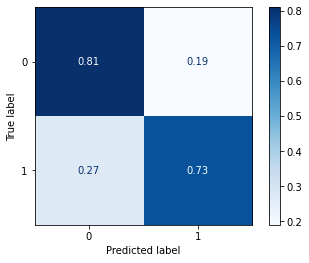

In [38]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(xgb_clf, x_test, y_test, cmap = plt.cm.Blues, normalize = "true")

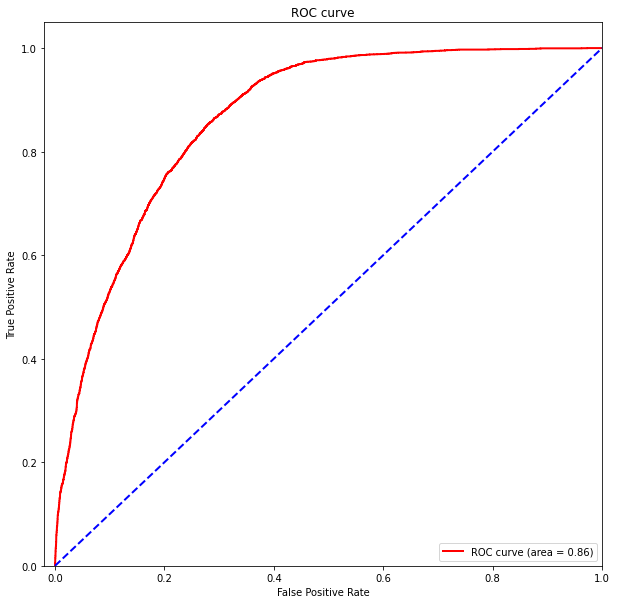

In [39]:
# Compute micro-average ROC curve and ROC area
fpr, tpr, _ = roc_curve(y_test.values, xgb_pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10,10))
lw = 2
plt.plot(fpr, tpr, color='red',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='blue', lw=lw, linestyle='--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right")
plt.show()

<AxesSubplot: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

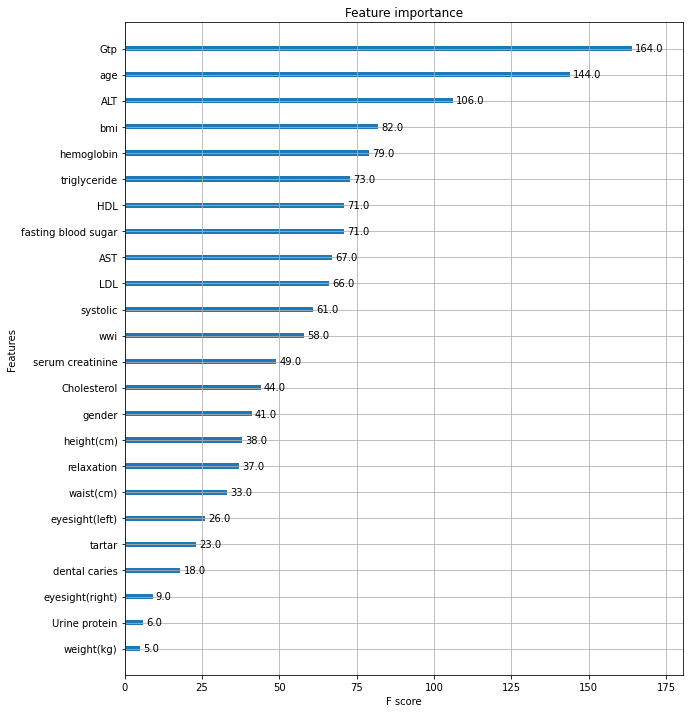

In [40]:
fig, ax = plt.subplots(figsize=(10,12)) # 축 반환
plot_importance(xgb_clf,ax=ax)

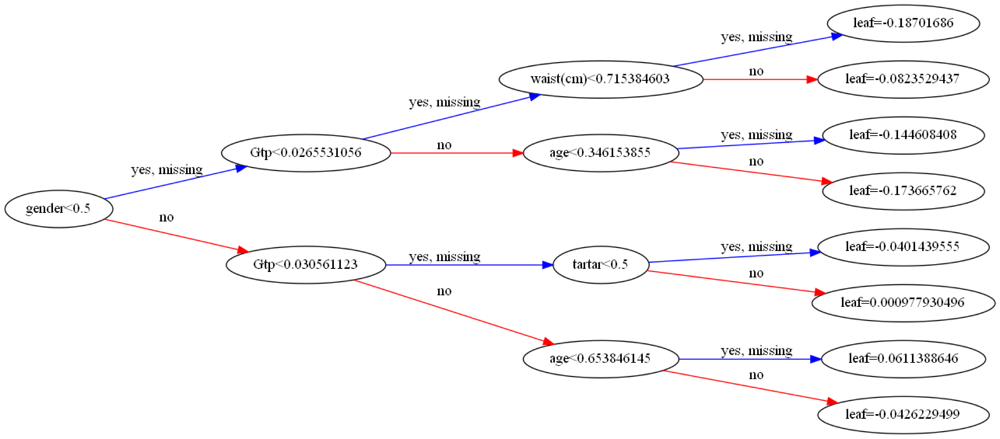

In [41]:
# num_trees : 그림을 여러개 그릴시 그림 번호
# rankdir : 트리의 방향, 디폴트는 위아래 방향
# rankdir="LR" : 왼쪽에서 오른쪽 방향으로 트리를 보여준다.
xgb.plot_tree(xgb_clf, num_trees=0, rankdir='LR')

fig = plt.gcf()
fig.set_size_inches(150, 100)

# 이미지 저장하고 싶다면
# fig.savefig('xgb_tree_skl_wp.png')

plt.show()

#### 2.2.2 Grid Search를 이용한 최적 하이퍼 파라미터 탐색

In [97]:
from sklearn.model_selection import GridSearchCV
# xgb 모델 생성
xgb = XGBClassifier(learning_rate=0.1, 
                    n_estimators=200,
                    gamma=0, 
                    subsample=0.8, # 각 트리마다의 관측 데이터 샘플링 비율, default = 1, 일반적으로 0.5 ~ 1
                    colsample_bytree=0.8, # 각 트리마다의 feature 샘플링 비율, default = 1, 일반적으로 0.5 ~ 1
                    objective= 'binary:logistic', 
                    verbose=10)

# parameter 들을 dictionary 형태로 설정
xgb_params = { 
              'max_depth':range(3,13,3), 
              'min_child_weight':range(1,6,2)
             }

In [98]:
start = time.time()
# GridSearch를 통해 최적 hyperparameter를 검색
clf = GridSearchCV(xgb,xgb_params,scoring='accuracy',cv=5)
clf.fit(x_train, y_train)
print(clf.best_params_)
pred = clf.predict(x_test)
print('분류 결과 : {0:.1f} '.format(accuracy_score(y_test,pred)))
end = time.time()
print("XGB 수행 시간: {0:.1f} 초 ".format(end - start))

KeyboardInterrupt: 

In [ ]:
# xgb 모델 생성
xgb = XGBClassifier(learning_rate=0.1, 
                    n_estimators=2000,
                    max_depth=3,
                    min_child_weight=3,
                    gamma=0, 
                    subsample=0.8, # 각 트리마다의 관측 데이터 샘플링 비율, default = 1, 일반적으로 0.5 ~ 1
                    colsample_bytree=0.8, # 각 트리마다의 feature 샘플링 비율, default = 1, 일반적으로 0.5 ~ 1
                    objective= 'binary:logistic', 
                    verbose=10)

# parameter 들을 dictionary 형태로 설정
xgb_params = { 
              'gamma':[i/10.0 for i in range(0,5)]
             }

In [ ]:
start = time.time()
# GridSearch를 통해 최적 hyperparameter를 검색
clf = GridSearchCV(xgb,xgb_params,scoring='accuracy',cv=5)
clf.fit(x_train, y_train)
print(clf.best_params_)
pred = clf.predict(x_test)
print('분류 결과 : {0:.1f} '.format(accuracy_score(y_test,pred)))
end = time.time()
print("XGB 수행 시간: {0:.1f} 초 ".format(end - start))

In [ ]:
# xgb 모델 생성
xgb = XGBClassifier(learning_rate=0.1, 
                    n_estimators=2000,
                    max_depth=3,
                    min_child_weight=3,
                    gamma=0, 
                    subsample=0.8, # 각 트리마다의 관측 데이터 샘플링 비율, default = 1, 일반적으로 0.5 ~ 1
                    colsample_bytree=0.8, # 각 트리마다의 feature 샘플링 비율, default = 1, 일반적으로 0.5 ~ 1
                    objective= 'binary:logistic', 
                    verbose=10)

# parameter 들을 dictionary 형태로 설정
xgb_params = { 
              'subsample':[i/10.0 for i in range(6,10)],
              'colsample_bytree':[i/10.0 for i in range(6,10)]
             }

In [ ]:
start = time.time()
# GridSearch를 통해 최적 hyperparameter를 검색
clf = GridSearchCV(xgb,xgb_params,scoring='accuracy',cv=5)
clf.fit(x_train, y_train)
print(clf.best_params_)
pred = clf.predict(x_test)
print('분류 결과 : {0:.1f} '.format(accuracy_score(y_test,pred)))
end = time.time()
print("XGB 수행 시간: {0:.1f} 초 ".format(end - start))

In [75]:
# Train the model
start = time.time()
xgb_clf = XGBClassifier(learning_rate=0.1, 
                        n_estimators=2000,
                        max_depth=6,
                        min_child_weight=3,
                        gamma=0, 
                        subsample=0.9, # 각 트리마다의 관측 데이터 샘플링 비율, default = 1, 일반적으로 0.5 ~ 1
                        colsample_bytree=0.8, # 각 트리마다의 feature 샘플링 비율, default = 1, 일반적으로 0.5 ~ 1
                        objective= 'binary:logistic', 
                        verbose=10).fit(x_train,y_train)
# Make prediction
xgb_pred = xgb_clf.predict(x_test)
# Get predicted probability
xgb_pred_probs = xgb_clf.predict_proba(x_test)[:,1]
end = time.time()
print("XGB 수행 시간: {0:.1f} 초 ".format(end - start)) # 
print('분류 결과 : {0:.1f} '.format(accuracy_score(y_test,xgb_pred)))

XGB 수행 시간: 24.3 초 
분류 결과 : 1.0 


In [76]:
get_clf_eval(y_test, xgb_pred, xgb_pred_probs)

오차 행렬
[[7000   36]
 [  42 4061]]
정확도: 0.9930, 정밀도: 0.9912, 재현율: 0.9898,F1: 0.9905, AUC:0.9998


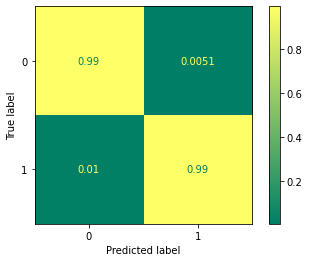

In [78]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(xgb_clf, x_test, y_test, cmap = 'summer', normalize = "true")

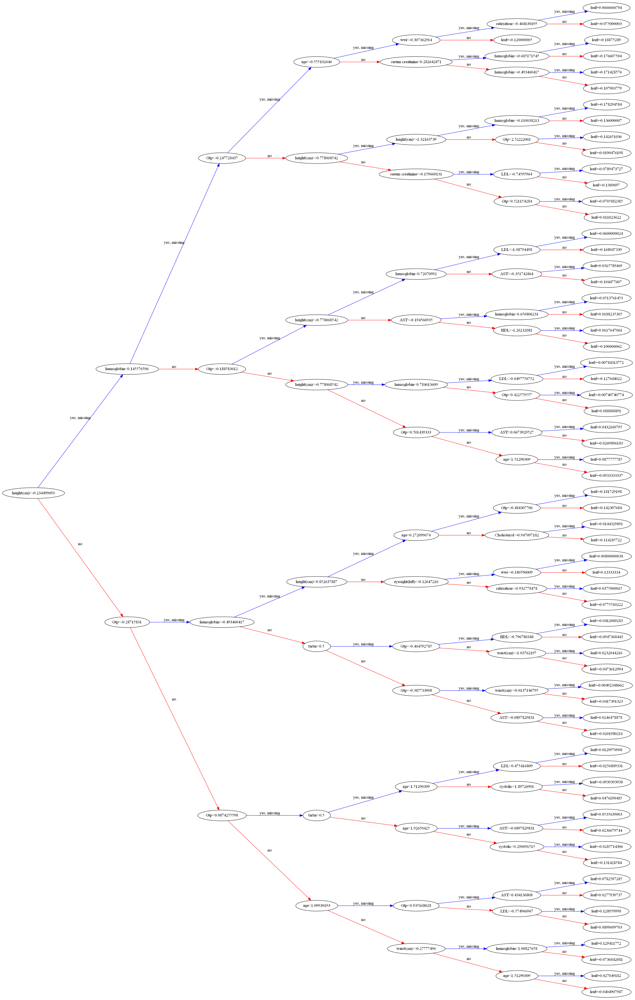

In [79]:
import xgboost as xgb

# num_trees : 그림을 여러개 그릴시 그림 번호
# rankdir : 트리의 방향, 디폴트는 위아래 방향
# rankdir="LR" : 왼쪽에서 오른쪽 방향으로 트리를 보여준다.
xgb.plot_tree(xgb_clf, num_trees=0, rankdir='LR')

fig = plt.gcf()
fig.set_size_inches(150, 100)

# 이미지 저장하고 싶다면
# fig.savefig('xgb_clf_tree.png')

plt.show()

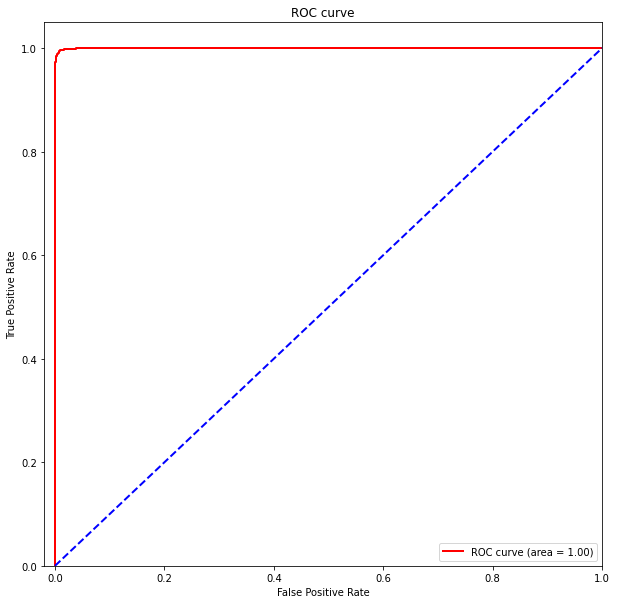

In [81]:
# Compute micro-average ROC curve and ROC area
fpr, tpr, _ = roc_curve(y_test.values, xgb_pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10,10))
lw = 2
plt.plot(fpr, tpr, color='red',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='blue', lw=lw, linestyle='--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right")
plt.show()

## 3. Light GBM

#### Parameters
- num_iterations : 수행 반복 횟수
    - Default : 100)
    - 학습에 활용될 weak learner의 반복 수
- learning_rate : 학습률
    - Default : 0.1
    - 일반적으로 확습률(learning rate)로 불리우는 파라미터
    - weak learner의 반영 수준을 나타냄
    - 범위는 0 ~ 1로 클 수록 모형의 업데이트 속도는 빨라짐. 클 수록 과적합의 이슈 발생 가능성이 높음
- max_depth : 최대 깊이
    - Default : -1
    - 트리의 최대 깊이를 설정
    - 0을 지정하면 깊이의 제한이 없음
    - 과적합에 가장 민감하게 작용하는 파라미터 중 하나임 (과적합 조절 용도로 사용됨)
    - 범위: 0 ~ ∞
- min_data_in_leaf : 노드 별 leaf 최소 개수
    - Default : 20
    - 최종 leaf node가 되기 위한 최소 레코드 수
    - 과적합 제어용으로 활용
- num_leaves
    - Default : 31
    - 하나의 트리가 가지는 최대 leaf 수
- boosting
    - Default : 'gbdt'
    - 실행하고자 하는 알고리즘 타입 정의
        - gdbt : Gradient Boosting Decision Tree
        - rf : Random Forest
        - dart : Dropouts meet Multiple Additive Regression Trees
        - goss : Gradient-based One-Side Sampling
- bagging_fraction
    - Default : 1.0)
    - 데이터 샘플링 비율
    - 과적합 제어용
- feature_fraction
    - Default 1.0)
    - 개별 트리 학습 시 선택하는 feature 비율
    - 과적합 제어용
- lamda_l2
    - Default : 0
    - L2 Regularization 적용 값
    - feature 개수가 많을 때 적용 검토
    - 클수록 과적합 감소 효과
- lamda_l1
    - Default : 0
    - L1 Regularization 적용 값
    - feature 개수가 많을 때 적용 검토
    - 클수록 과적합 감소 효과
- objective
    - Default : regression
        - regression : 회귀
        - binary : 이진분류
        - multiclass : 다중분류
- early_stopping_round
    - Default : 0
    - 이전 학습 대비 일정 수준 이상의 성능 효과가 없을 시 학습을 중단함
    - 지나친 iteration을 줄이는데 도움이 되기 때문에, 학습 속도를 높일 수 있음
- min_gain_to_split
    - Default : 0
    - 트리를 분기하기 위해 필요한 최소한의 gain
- max_cat_threshold
    - Default : 32
    - 카테고리 그룹을 정의된 수로 합치고 그룹 경계선에서 분기 포인트 searching
    - 카테고리 수가 클 때, 과적합을 방지하는 분기 포인트 searching

### 3.1 분류기 생성

In [64]:
# !pip install lightgbm

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.



     ---------------------------------------- 1.0/1.0 MB 8.1 MB/s eta 0:00:00


In [102]:
import lightgbm as lgb
from lightgbm import LGBMClassifier
from lightgbm import plot_importance # for visualization about features' importance by using plot_importance()

lgbm_clf = LGBMClassifier(n_estimators=200)
evals = [(x_test,y_test)]

start = time.time()

# 학습 : 조기중단 수행(100)
lgbm_clf.fit(x_train,y_train, 
             early_stopping_rounds=100, 
             eval_metric='logloss', 
             eval_set=evals, 
             verbose=True)
                

# 예측
lgbm_pred = lgbm_clf.predict(x_test)
lgbm_pred_probs = lgbm_clf.predict_proba(x_test)[:, 1]
end = time.time()
print("LGBM 수행 시간: {0:.1f} 초 ".format(end - start)) # 0.5 sec
print('분류 결과 : {0:.1f} '.format(accuracy_score(y_test,lgbm_pred)))

[1]	valid_0's binary_logloss: 0.627336
[2]	valid_0's binary_logloss: 0.601689
[3]	valid_0's binary_logloss: 0.580176
[4]	valid_0's binary_logloss: 0.562208
[5]	valid_0's binary_logloss: 0.5468
[6]	valid_0's binary_logloss: 0.533561
[7]	valid_0's binary_logloss: 0.522246
[8]	valid_0's binary_logloss: 0.512491
[9]	valid_0's binary_logloss: 0.503983
[10]	valid_0's binary_logloss: 0.496711
[11]	valid_0's binary_logloss: 0.490049
[12]	valid_0's binary_logloss: 0.484391
[13]	valid_0's binary_logloss: 0.479341
[14]	valid_0's binary_logloss: 0.474881
[15]	valid_0's binary_logloss: 0.470871
[16]	valid_0's binary_logloss: 0.467545
[17]	valid_0's binary_logloss: 0.464506
[18]	valid_0's binary_logloss: 0.461724
[19]	valid_0's binary_logloss: 0.459204
[20]	valid_0's binary_logloss: 0.45694
[21]	valid_0's binary_logloss: 0.454686
[22]	valid_0's binary_logloss: 0.452763
[23]	valid_0's binary_logloss: 0.450921
[24]	valid_0's binary_logloss: 0.449195
[25]	valid_0's binary_logloss: 0.447727
[26]	valid_0

In [66]:
# lgbm_clf.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 2000,
 'n_jobs': -1,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': 'warn',
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

#### 3.2 평가지표 시각화 : 오차행렬, ROC curve

In [67]:
def get_clf_eval(y_test, pred=None, pred_proba=None):
    confusion = confusion_matrix(y_test,pred)
    accuracy = accuracy_score(y_test,pred)
    precision = precision_score(y_test,pred)
    recall = recall_score(y_test,pred)
    f1 = f1_score(y_test,pred)
    # ROC-AUC 추가 
    roc_auc = roc_auc_score(y_test, pred_proba)
    print('오차 행렬')
    print(confusion)
    # ROC-AUC print 추가
    print('정확도: {0:.4f}, 정밀도: {1:.4f}, 재현율: {2:.4f},F1: {3:.4f}, AUC:{4:.4f}'.format(accuracy, precision, recall, f1, roc_auc))

In [103]:
get_clf_eval(y_test, lgbm_pred, lgbm_pred_probs)

오차 행렬
[[6000 1036]
 [ 867 3236]]
정확도: 0.8292, 정밀도: 0.7575, 재현율: 0.7887,    F1: 0.7728, AUC:0.9133


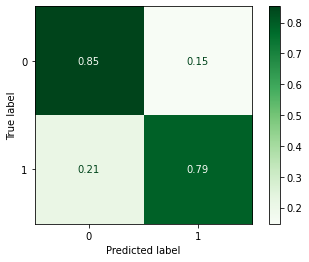

In [104]:
plot_confusion_matrix(lgbm_clf, x_test, y_test, cmap = plt.cm.Greens, normalize = "true")

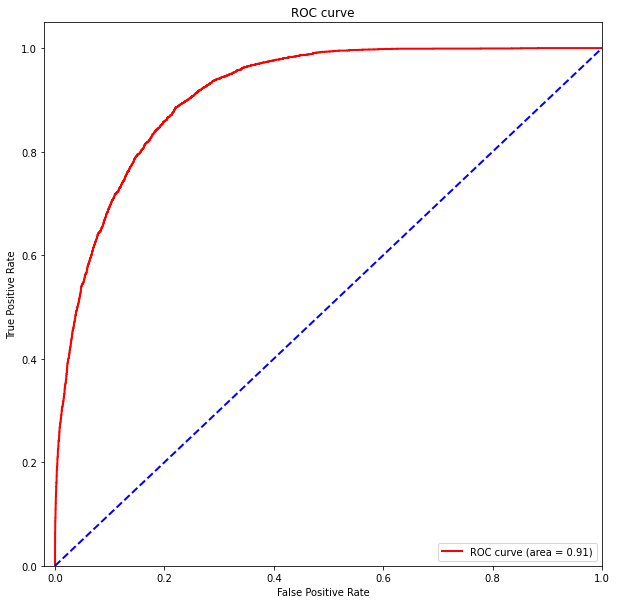

In [105]:
# Compute micro-average ROC curve and ROC area
fpr, tpr, _ = roc_curve(y_test.values, lgbm_pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10,10))
lw = 2
plt.plot(fpr, tpr, color='red',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='blue', lw=lw, linestyle='--')
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend(loc="lower right")
plt.show()

<AxesSubplot: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

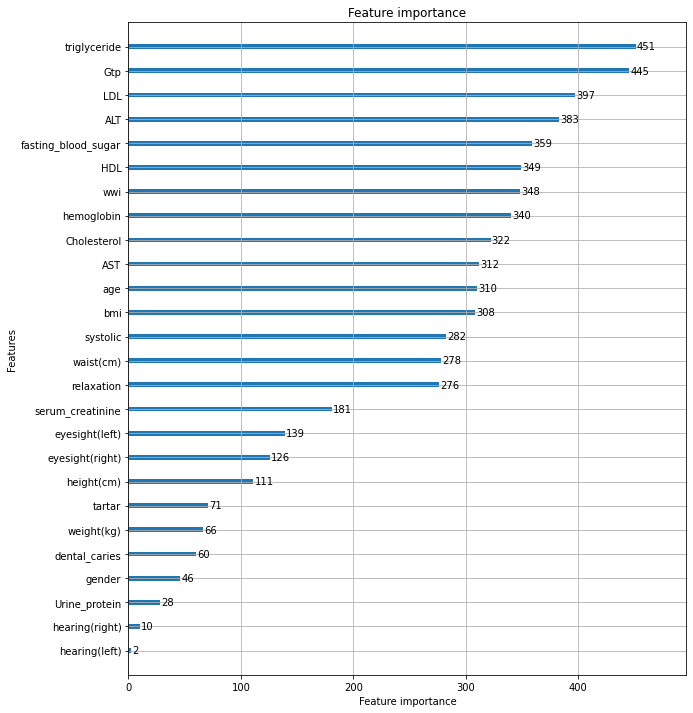

In [106]:
fig, ax = plt.subplots(figsize=(10, 12))
plot_importance(lgbm, ax=ax,importance_type='split')

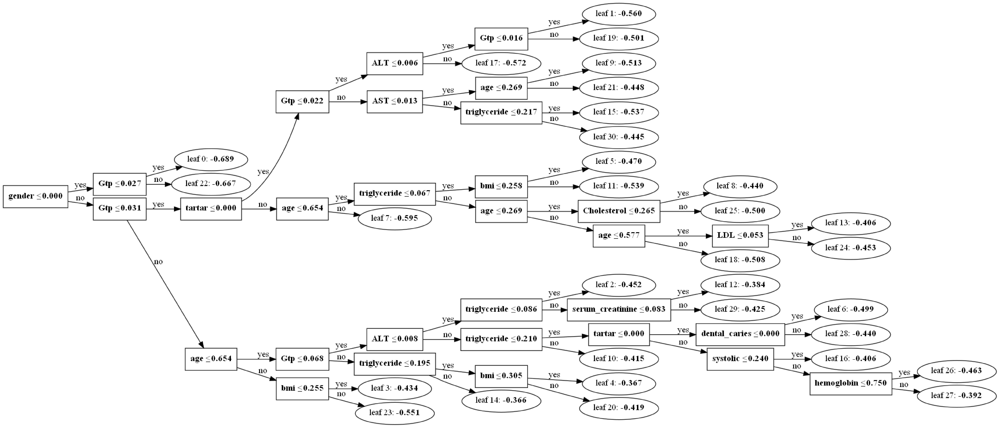

In [107]:
import lightgbm as lgb
lgb.plot_tree(lgbm_clf)

fig = plt.gcf()
fig.set_size_inches(150, 100)

# 이미지 저장하고 싶다면
# fig.savefig('lgbm_tree.png')

plt.show()

### 3.3 Grid Search를 이용하여 최적 하이퍼파라미터 탐색

In [ ]:
from sklearn.model_selection import GridSearchCV

# Generate the Light GBM model
lgbm_clf_1 = LGBMClassifier(learning_rate=0.1,n_estimators=200,
                            subsample=0.8, # 각 트리마다의 관측 데이터 샘플링 비율, default = 1, 일반적으로 0.5 ~ 1
                            colsample_bytree=0.8, # 각 트리마다의 feature 샘플링 비율, default = 1, 일반적으로 0.5 ~ 1
                            verbose=10)

# parameter 들을 dictionary 형태로 설정
lgbm_params = {'num_leaves':[33,65,97,129], #  num_leaves = 2^(max_depth)는 depth-wise tree와 같은 수의 leaves를 가지게 하여, 이보다 작게 설정해야 오버피팅을 줄일 수 있다.
               'max_depth':[-1,3,6,9,12], 
               'min_child_samples':[5,10,15],
               'min_child_weight':[1,3,5,7],
               'reg_alpha':[0,0.01,0.03]}

In [ ]:
start = time.time()
# GridSearch를 통해 최적 hyperparameter를 검색
grid_lgbm_clf = GridSearchCV(lgbm_clf_1,lgbm_params,scoring='accuracy',cv=5)
grid_lgbm_clf.fit(x_train, y_train)
print(grid_lgbm_clf.best_params_)
g_lgbm_pred_1 = grid_lgbm_clf.predict(x_test)
print('분류 결과 : {0:.1f} '.format(accuracy_score(y_test,g_lgbm_pred_1)))
end = time.time()
print("LGBM 수행 시간: {0:.1f} 초 ".format(end - start))

## 4. 이상값(Outlier) 관측 및 제거 후 결과 비교

**Outlier detection with IQR**

In [ ]:
from collections import Counter

def outlier_detection(df, n, columns):
    rows = []
    will_drop_train = []
    for col in columns:
        Q1 = np.nanpercentile(df[col], 25)
        Q3 = np.nanpercentile(df[col], 75)
        IQR = Q3 - Q1
        outlier_point = 1.5 * IQR
        rows.extend(df[(df[col] < Q1 - outlier_point)|(df[col] > Q3 + outlier_point)].index)
    for r, c in Counter(rows).items():
        if c >= n: will_drop_train.append(r)
    return will_drop_train

will_drop_train = outlier_detection(df, 5, df.select_dtypes(["float", "int"]).columns)
will_drop_train[0:5]

[44, 2677, 3368, 3592, 4171]

In [ ]:
will_drop_train = outlier_detection(x_train, 5, x_train.select_dtypes(["float", "int"]).columns)
will_drop_train[0:5]

[44, 2677, 3368, 3592, 4171]

In [ ]:
x_train.drop(will_drop_train, inplace = True, axis = 0)
y_train.drop(will_drop_train, inplace = True, axis = 0)

In [ ]:
df.drop(will_drop_train, inplace = True, axis = 0)
df

,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,tartar,smoking,bmi,wwi
0,0,40,155,60,81.3,1.2,1.0,1.0,1.0,114.0,73.0,94.0,215.0,82.0,73.0,126.0,12.9,1.0,0.7,18.0,19.0,27.0,0,1,0,24.973985,10.495785
1,0,40,160,60,81.0,0.8,0.6,1.0,1.0,119.0,70.0,130.0,192.0,115.0,42.0,127.0,12.7,1.0,0.6,22.0,19.0,18.0,0,1,0,23.437500,10.457055
2,1,55,170,60,80.0,0.8,0.8,1.0,1.0,138.0,86.0,89.0,242.0,182.0,55.0,151.0,15.8,1.0,1.0,21.0,16.0,22.0,0,0,1,20.761246,10.327956
3,1,40,165,70,88.0,1.5,1.5,1.0,1.0,100.0,60.0,96.0,322.0,254.0,45.0,226.0,14.7,1.0,1.0,19.0,26.0,18.0,0,1,0,25.711662,10.518012
4,0,40,155,60,86.0,1.0,1.0,1.0,1.0,120.0,74.0,80.0,184.0,74.0,62.0,107.0,12.5,1.0,0.6,16.0,14.0,22.0,0,0,0,24.973985,11.102552
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55687,0,40,170,65,75.0,0.9,0.9,1.0,1.0,110.0,68.0,89.0,213.0,99.0,75.0,118.0,12.3,1.0,0.6,14.0,7.0,10.0,1,1,0,22.491349,9.302605
55688,0,45,160,50,70.0,1.2,1.2,1.0,1.0,101.0,62.0,89.0,166.0,69.0,73.0,79.0,14.0,1.0,0.9,20.0,12.0,14.0,0,1,0,19.531250,9.899495
55689,0,55,160,50,68.5,1.0,1.2,1.0,1.0,117.0,72.0,88.0,158.0,77.0,79.0,63.0,12.4,1.0,0.5,17.0,11.0,12.0,0,0,0,19.531250,9.687363
55690,1,60,165,60,78.0,0.8,1.0,1.0,1.0,133.0,76.0,107.0,210.0,79.0,48.0,146.0,14.4,1.0,0.7,20.0,19.0,18.0,0,0,0,22.038567,10.069757


In [ ]:
# after deleting outlier data

wlist = [(dtrain,'train'),(dtest,'eval')]
start = time.time()
xgb_model = xgb.train(params = params, dtrain=dtrain,num_boost_round= num_rounds,
                      early_stopping_rounds=100,evals = wlist)
end = time.time()
print("XGB 수행 시간: {0:.1f} 초 ".format(end - start)) # 29.1 sec
pred_probs = xgb_model.predict(dtest)
preds = [1 if x > 0.5 else 0 for x in pred_probs]
print('분류 결과 : {0:.1f} '.format(accuracy_score(y_test,preds)))

[0]	train-logloss:0.65857	eval-logloss:0.65794
[1]	train-logloss:0.62994	eval-logloss:0.62888
[2]	train-logloss:0.60586	eval-logloss:0.60428
[3]	train-logloss:0.58568	eval-logloss:0.58370
[4]	train-logloss:0.56833	eval-logloss:0.56601
[5]	train-logloss:0.55341	eval-logloss:0.55083
[6]	train-logloss:0.54039	eval-logloss:0.53766
[7]	train-logloss:0.52910	eval-logloss:0.52611
[8]	train-logloss:0.51928	eval-logloss:0.51616
[9]	train-logloss:0.51068	eval-logloss:0.50736
[10]	train-logloss:0.50292	eval-logloss:0.49941
[11]	train-logloss:0.49610	eval-logloss:0.49251
[12]	train-logloss:0.49021	eval-logloss:0.48650
[13]	train-logloss:0.48484	eval-logloss:0.48110
[14]	train-logloss:0.47989	eval-logloss:0.47604
[15]	train-logloss:0.47556	eval-logloss:0.47157
[16]	train-logloss:0.47179	eval-logloss:0.46773
[17]	train-logloss:0.46828	eval-logloss:0.46418
[18]	train-logloss:0.46507	eval-logloss:0.46094
[19]	train-logloss:0.46214	eval-logloss:0.45802
[20]	train-logloss:0.45948	eval-logloss:0.45532
[2

In [ ]:
def get_clf_eval(y_test, pred=None, pred_proba=None):
    confusion = confusion_matrix(y_test,pred)
    accuracy = accuracy_score(y_test,pred)
    precision = precision_score(y_test,pred)
    recall = recall_score(y_test,pred)
    f1 = f1_score(y_test,pred)
    # ROC-AUC 추가 
    roc_auc = roc_auc_score(y_test,pred_proba)
    print('오차 행렬')
    print(confusion)
    # ROC-AUC print 추가
    print('정확도: {0:.4f}, 정밀도: {1:.4f}, 재현율: {2:.4f},\
    F1: {3:.4f}, AUC:{4:.4f}'.format(accuracy, precision, recall, f1, roc_auc))

In [ ]:
get_clf_eval(y_test, preds, pred_probs)

오차 행렬
[[6979   57]
 [  60 4043]]
정확도: 0.9895, 정밀도: 0.9861, 재현율: 0.9854,    F1: 0.9857, AUC:0.9995


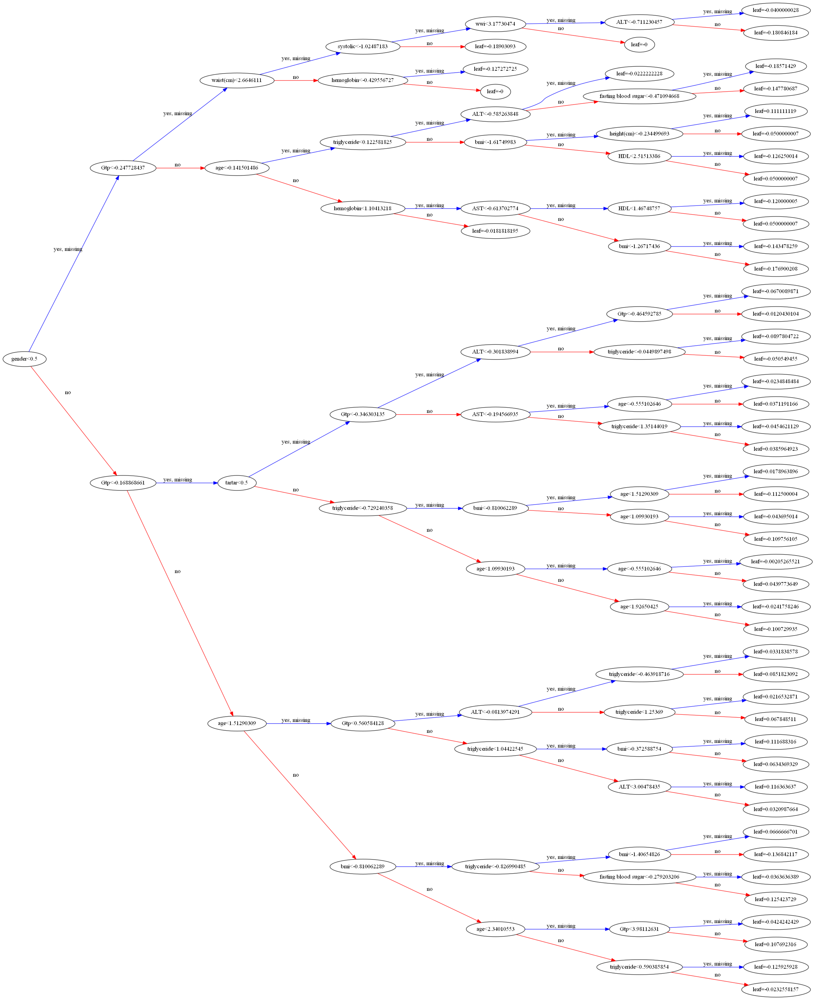

In [ ]:
# num_trees : 그림을 여러개 그릴시 그림 번호
# rankdir : 트리의 방향, 디폴트는 위아래 방향
# rankdir="LR" : 왼쪽에서 오른쪽 방향으로 트리를 보여준다.
xgb.plot_tree(xgb_model, num_trees=0, rankdir='LR')

fig = plt.gcf()
fig.set_size_inches(150, 100)

# 이미지 저장하고 싶다면
# fig.savefig('xgb_tree_py_wp.png')

plt.show()

In [ ]:
# after deleting the outlier data
# Train the model
start = time.time()
xgb_clf = XGBClassifier(learning_rate=0.1,n_estimators=2000,max_depth=3,
                        silent=True,
                        objective='binary:logistic',
                        booster='gbtree',
                        n_jobs=1,
                        nthread=None,
                        gamma=0).fit(x_train,y_train)
# Make prediction
xgb_pred = xgb_clf.predict(x_test)
# Get predicted probability
xgb_pred_probs = xgb_clf.predict_proba(x_test)[:,1]
end = time.time()
print("XGB 수행 시간: {0:.1f} 초 ".format(end - start)) # 
print('분류 결과 : {0:.1f} '.format(accuracy_score(y_test,xgb_pred)))

XGB 수행 시간: 47.2 초 
분류 결과 : 0.8 


In [ ]:
get_clf_eval(y_test, xgb_pred, xgb_pred_probs)
# 평가 지표의 수치가 하락함

오차 행렬
[[5988 1048]
 [1018 3085]]
정확도: 0.8145, 정밀도: 0.7464, 재현율: 0.7519,    F1: 0.7492, AUC:0.8978


## 5. Scaler 별 결과 비교

In [115]:
std_x_train, std_x_test = scaling(x_train, x_test, 'StandardScaler()')

In [116]:
rbt_x_train, rbt_x_test = scaling(x_train, x_test, 'RobustScaler()')

In [117]:
log_x_train, log_x_test = scaling(x_train, x_test, 'logScaler')

In [118]:
mmx_x_train, mmx_x_test = scaling(x_train, x_test)

array([[<AxesSubplot: title={'center': 'gender'}>,
        <AxesSubplot: title={'center': 'age'}>,
        <AxesSubplot: title={'center': 'height(cm)'}>,
        <AxesSubplot: title={'center': 'weight(kg)'}>,
        <AxesSubplot: title={'center': 'waist(cm)'}>],
       [<AxesSubplot: title={'center': 'eyesight(left)'}>,
        <AxesSubplot: title={'center': 'eyesight(right)'}>,
        <AxesSubplot: title={'center': 'hearing(left)'}>,
        <AxesSubplot: title={'center': 'hearing(right)'}>,
        <AxesSubplot: title={'center': 'systolic'}>],
       [<AxesSubplot: title={'center': 'relaxation'}>,
        <AxesSubplot: title={'center': 'fasting blood sugar'}>,
        <AxesSubplot: title={'center': 'Cholesterol'}>,
        <AxesSubplot: title={'center': 'triglyceride'}>,
        <AxesSubplot: title={'center': 'HDL'}>],
       [<AxesSubplot: title={'center': 'LDL'}>,
        <AxesSubplot: title={'center': 'hemoglobin'}>,
        <AxesSubplot: title={'center': 'Urine protein'}>,
    

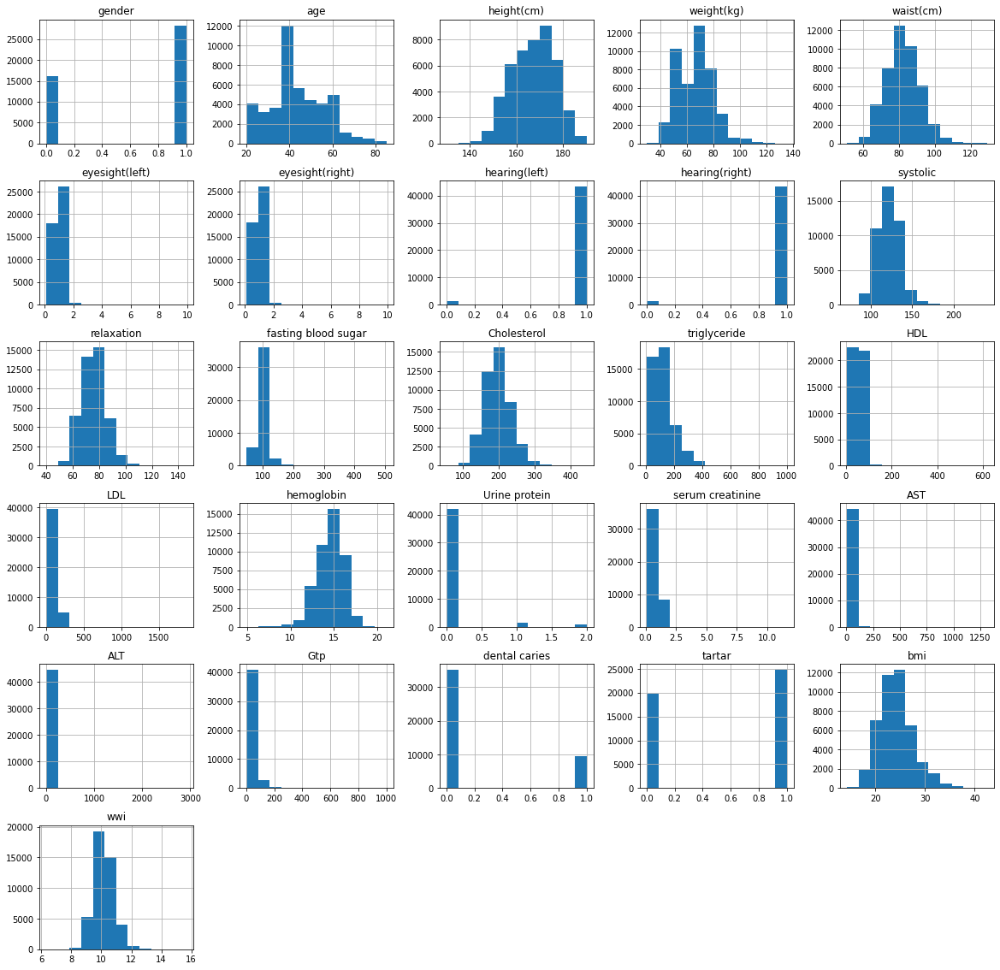

In [119]:
# x_train 시각화
x_train.hist(figsize = (20, 20), bins = 12, legend=False)

array([[<AxesSubplot: title={'center': 'gender'}>,
        <AxesSubplot: title={'center': 'age'}>,
        <AxesSubplot: title={'center': 'height(cm)'}>,
        <AxesSubplot: title={'center': 'weight(kg)'}>,
        <AxesSubplot: title={'center': 'waist(cm)'}>],
       [<AxesSubplot: title={'center': 'eyesight(left)'}>,
        <AxesSubplot: title={'center': 'eyesight(right)'}>,
        <AxesSubplot: title={'center': 'hearing(left)'}>,
        <AxesSubplot: title={'center': 'hearing(right)'}>,
        <AxesSubplot: title={'center': 'systolic'}>],
       [<AxesSubplot: title={'center': 'relaxation'}>,
        <AxesSubplot: title={'center': 'fasting blood sugar'}>,
        <AxesSubplot: title={'center': 'Cholesterol'}>,
        <AxesSubplot: title={'center': 'triglyceride'}>,
        <AxesSubplot: title={'center': 'HDL'}>],
       [<AxesSubplot: title={'center': 'LDL'}>,
        <AxesSubplot: title={'center': 'hemoglobin'}>,
        <AxesSubplot: title={'center': 'Urine protein'}>,
    

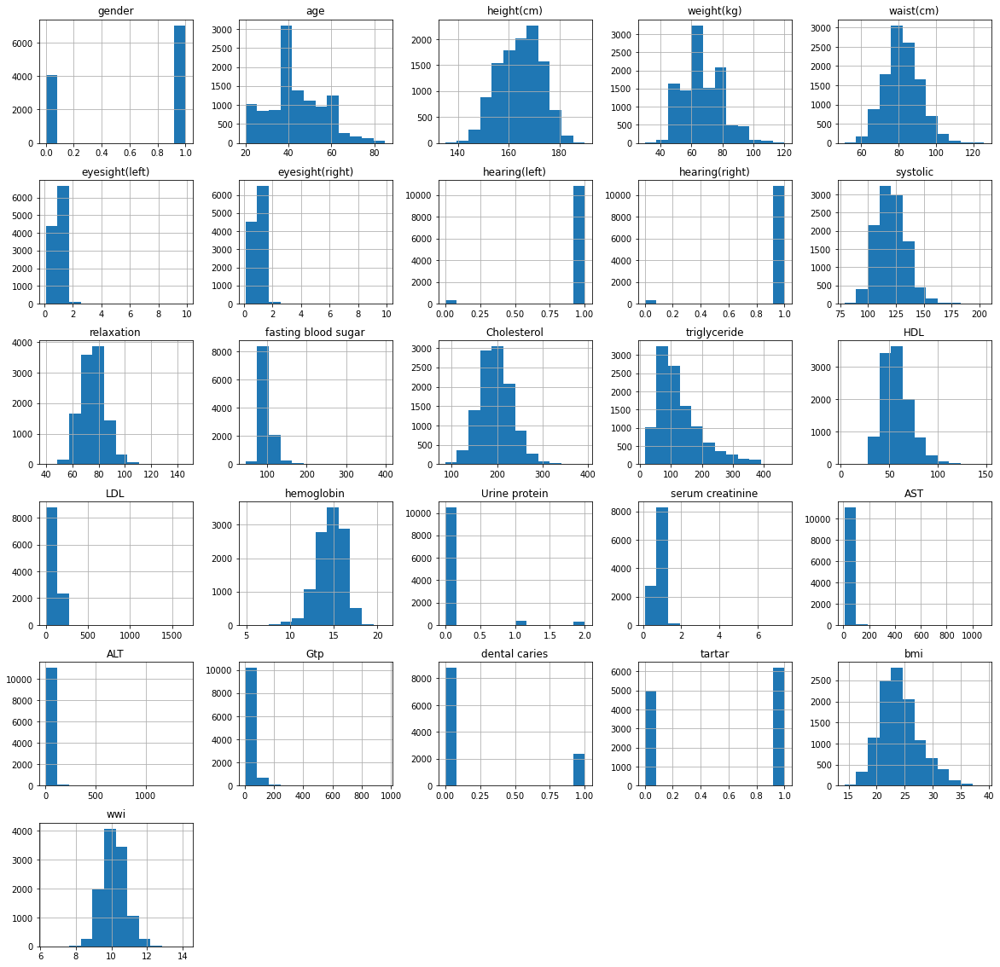

In [120]:
# x_test 시각화
x_test.hist(figsize = (20, 20), bins = 12, legend=False)

array([[<AxesSubplot: title={'center': 'age'}>,
        <AxesSubplot: title={'center': 'height(cm)'}>,
        <AxesSubplot: title={'center': 'weight(kg)'}>,
        <AxesSubplot: title={'center': 'waist(cm)'}>,
        <AxesSubplot: title={'center': 'eyesight(left)'}>],
       [<AxesSubplot: title={'center': 'eyesight(right)'}>,
        <AxesSubplot: title={'center': 'systolic'}>,
        <AxesSubplot: title={'center': 'relaxation'}>,
        <AxesSubplot: title={'center': 'fasting blood sugar'}>,
        <AxesSubplot: title={'center': 'Cholesterol'}>],
       [<AxesSubplot: title={'center': 'triglyceride'}>,
        <AxesSubplot: title={'center': 'HDL'}>,
        <AxesSubplot: title={'center': 'LDL'}>,
        <AxesSubplot: title={'center': 'hemoglobin'}>,
        <AxesSubplot: title={'center': 'Urine protein'}>],
       [<AxesSubplot: title={'center': 'serum creatinine'}>,
        <AxesSubplot: title={'center': 'AST'}>,
        <AxesSubplot: title={'center': 'ALT'}>,
        <AxesSu

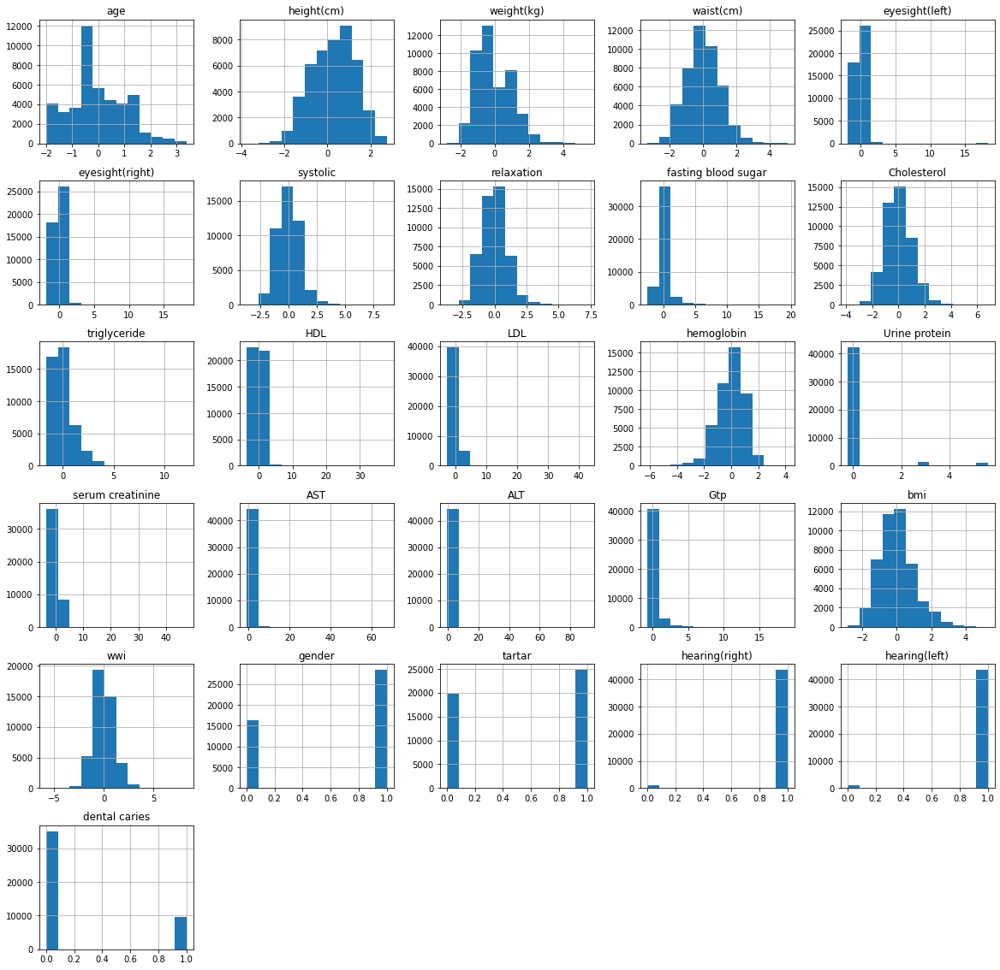

In [121]:
# std_x_train 시각화
std_x_train.hist(figsize = (20, 20), bins = 12, legend=False)

array([[<AxesSubplot: title={'center': 'age'}>,
        <AxesSubplot: title={'center': 'height(cm)'}>,
        <AxesSubplot: title={'center': 'weight(kg)'}>,
        <AxesSubplot: title={'center': 'waist(cm)'}>,
        <AxesSubplot: title={'center': 'eyesight(left)'}>],
       [<AxesSubplot: title={'center': 'eyesight(right)'}>,
        <AxesSubplot: title={'center': 'systolic'}>,
        <AxesSubplot: title={'center': 'relaxation'}>,
        <AxesSubplot: title={'center': 'fasting blood sugar'}>,
        <AxesSubplot: title={'center': 'Cholesterol'}>],
       [<AxesSubplot: title={'center': 'triglyceride'}>,
        <AxesSubplot: title={'center': 'HDL'}>,
        <AxesSubplot: title={'center': 'LDL'}>,
        <AxesSubplot: title={'center': 'hemoglobin'}>,
        <AxesSubplot: title={'center': 'Urine protein'}>],
       [<AxesSubplot: title={'center': 'serum creatinine'}>,
        <AxesSubplot: title={'center': 'AST'}>,
        <AxesSubplot: title={'center': 'ALT'}>,
        <AxesSu

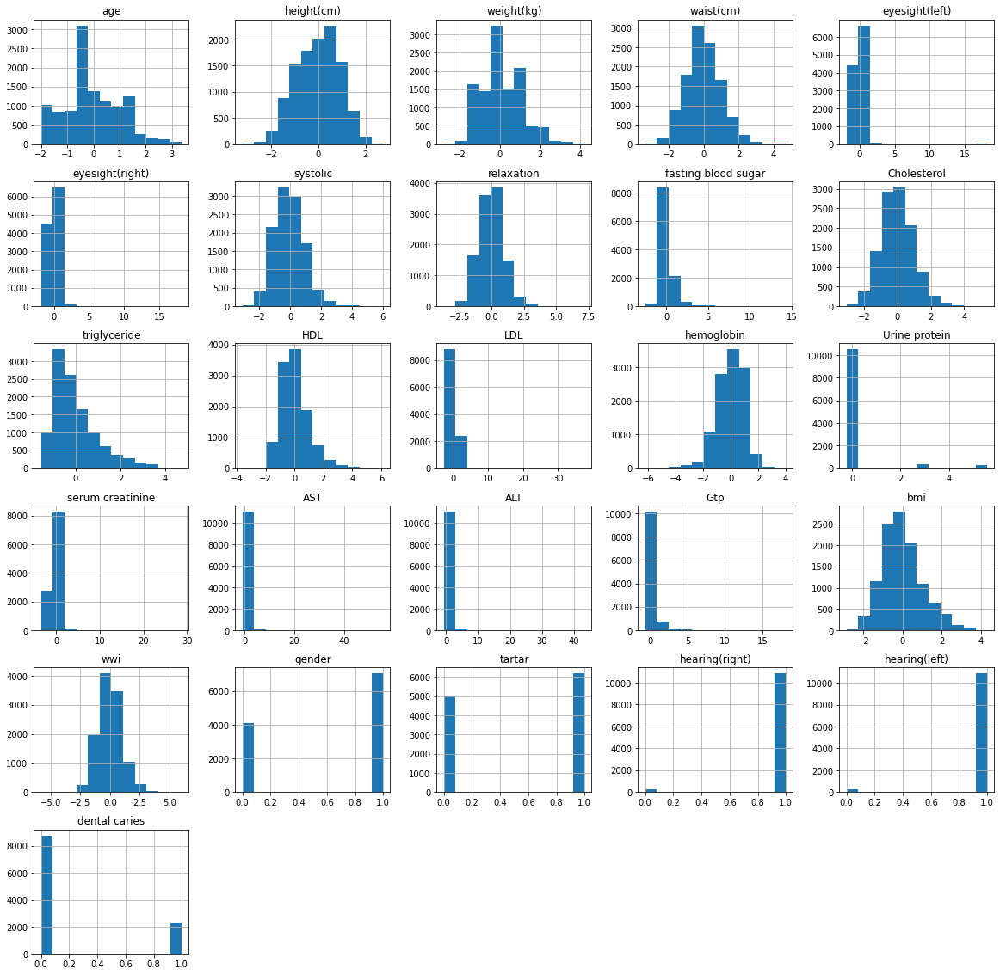

In [122]:
# std_x_test 시각화
std_x_test.hist(figsize = (20, 20), bins = 12, legend=False)

array([[<AxesSubplot: title={'center': 'age'}>,
        <AxesSubplot: title={'center': 'height(cm)'}>,
        <AxesSubplot: title={'center': 'weight(kg)'}>,
        <AxesSubplot: title={'center': 'waist(cm)'}>,
        <AxesSubplot: title={'center': 'eyesight(left)'}>],
       [<AxesSubplot: title={'center': 'eyesight(right)'}>,
        <AxesSubplot: title={'center': 'systolic'}>,
        <AxesSubplot: title={'center': 'relaxation'}>,
        <AxesSubplot: title={'center': 'fasting blood sugar'}>,
        <AxesSubplot: title={'center': 'Cholesterol'}>],
       [<AxesSubplot: title={'center': 'triglyceride'}>,
        <AxesSubplot: title={'center': 'HDL'}>,
        <AxesSubplot: title={'center': 'LDL'}>,
        <AxesSubplot: title={'center': 'hemoglobin'}>,
        <AxesSubplot: title={'center': 'Urine protein'}>],
       [<AxesSubplot: title={'center': 'serum creatinine'}>,
        <AxesSubplot: title={'center': 'AST'}>,
        <AxesSubplot: title={'center': 'ALT'}>,
        <AxesSu

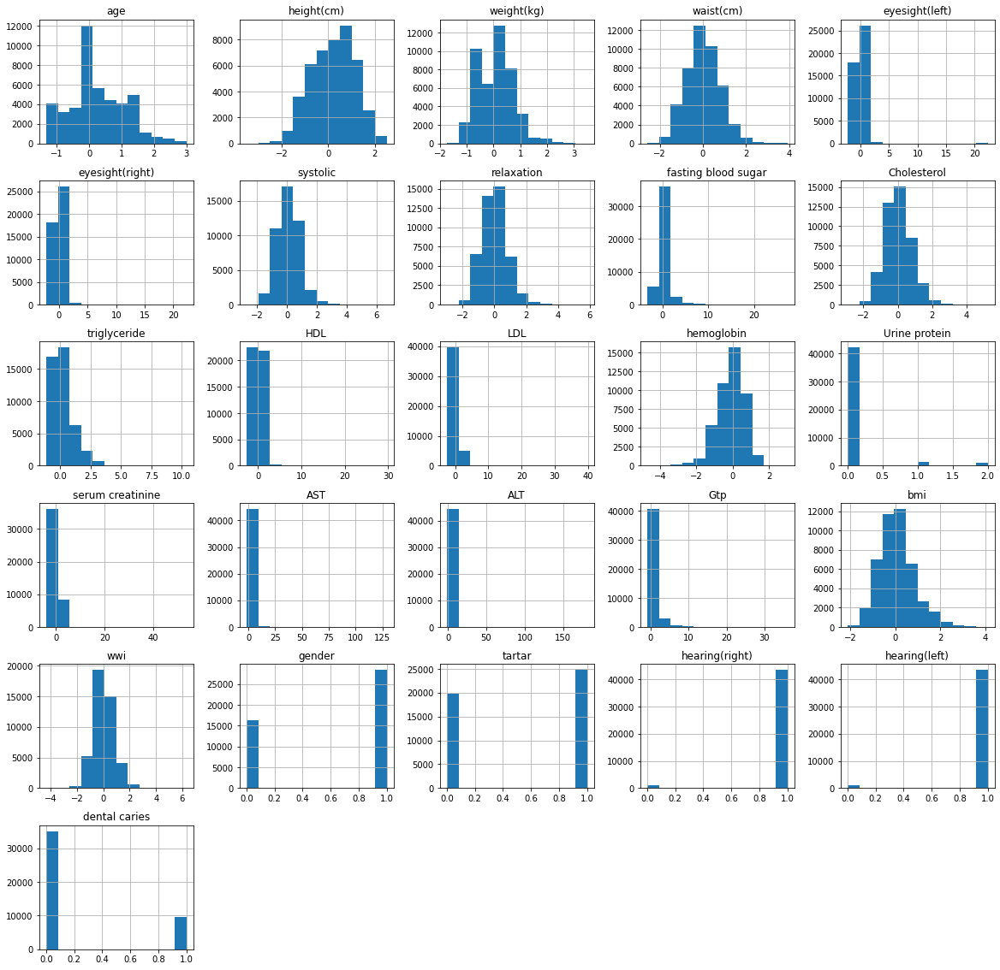

In [123]:
# rbt_x_train 시각화
rbt_x_train.hist(figsize = (20, 20), bins = 12, legend=False)

array([[<AxesSubplot: title={'center': 'age'}>,
        <AxesSubplot: title={'center': 'height(cm)'}>,
        <AxesSubplot: title={'center': 'weight(kg)'}>,
        <AxesSubplot: title={'center': 'waist(cm)'}>,
        <AxesSubplot: title={'center': 'eyesight(left)'}>],
       [<AxesSubplot: title={'center': 'eyesight(right)'}>,
        <AxesSubplot: title={'center': 'systolic'}>,
        <AxesSubplot: title={'center': 'relaxation'}>,
        <AxesSubplot: title={'center': 'fasting blood sugar'}>,
        <AxesSubplot: title={'center': 'Cholesterol'}>],
       [<AxesSubplot: title={'center': 'triglyceride'}>,
        <AxesSubplot: title={'center': 'HDL'}>,
        <AxesSubplot: title={'center': 'LDL'}>,
        <AxesSubplot: title={'center': 'hemoglobin'}>,
        <AxesSubplot: title={'center': 'Urine protein'}>],
       [<AxesSubplot: title={'center': 'serum creatinine'}>,
        <AxesSubplot: title={'center': 'AST'}>,
        <AxesSubplot: title={'center': 'ALT'}>,
        <AxesSu

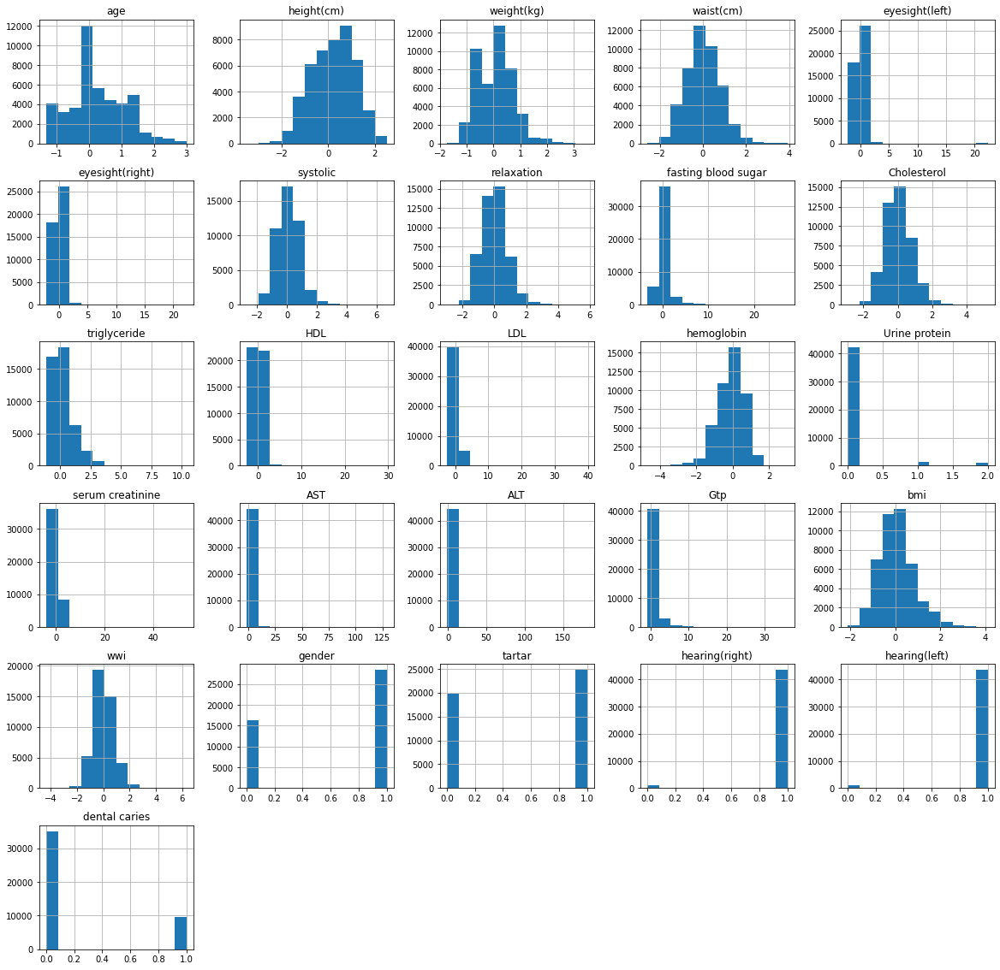

In [124]:
# rbt_x_train 시각화
rbt_x_train.hist(figsize = (20, 20), bins = 12, legend=False)

array([[<AxesSubplot: title={'center': 'age'}>,
        <AxesSubplot: title={'center': 'height(cm)'}>,
        <AxesSubplot: title={'center': 'weight(kg)'}>,
        <AxesSubplot: title={'center': 'waist(cm)'}>,
        <AxesSubplot: title={'center': 'eyesight(left)'}>],
       [<AxesSubplot: title={'center': 'eyesight(right)'}>,
        <AxesSubplot: title={'center': 'systolic'}>,
        <AxesSubplot: title={'center': 'relaxation'}>,
        <AxesSubplot: title={'center': 'fasting blood sugar'}>,
        <AxesSubplot: title={'center': 'Cholesterol'}>],
       [<AxesSubplot: title={'center': 'triglyceride'}>,
        <AxesSubplot: title={'center': 'HDL'}>,
        <AxesSubplot: title={'center': 'LDL'}>,
        <AxesSubplot: title={'center': 'hemoglobin'}>,
        <AxesSubplot: title={'center': 'Urine protein'}>],
       [<AxesSubplot: title={'center': 'serum creatinine'}>,
        <AxesSubplot: title={'center': 'AST'}>,
        <AxesSubplot: title={'center': 'ALT'}>,
        <AxesSu

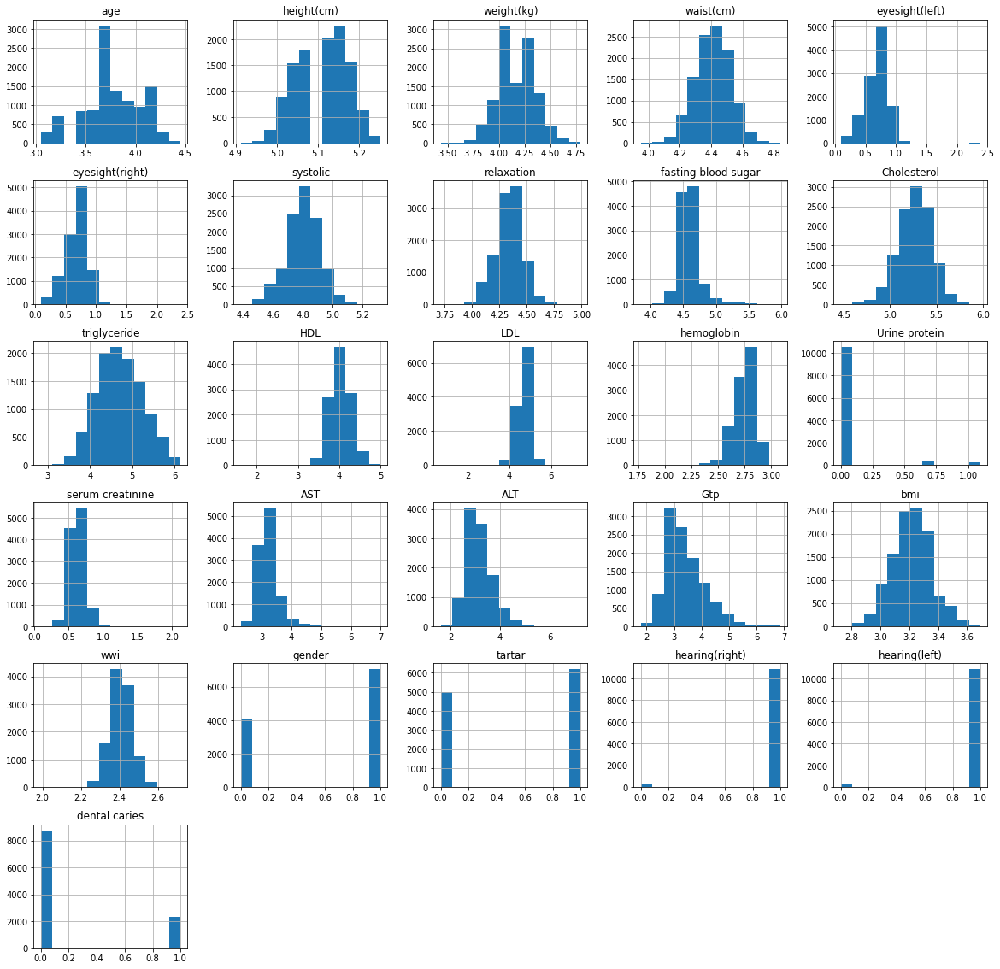

In [125]:
# log_x_test 시각화
log_x_test.hist(figsize = (20, 20), bins = 12, legend=False)

array([[<AxesSubplot: title={'center': 'age'}>,
        <AxesSubplot: title={'center': 'height(cm)'}>,
        <AxesSubplot: title={'center': 'weight(kg)'}>,
        <AxesSubplot: title={'center': 'waist(cm)'}>,
        <AxesSubplot: title={'center': 'eyesight(left)'}>],
       [<AxesSubplot: title={'center': 'eyesight(right)'}>,
        <AxesSubplot: title={'center': 'systolic'}>,
        <AxesSubplot: title={'center': 'relaxation'}>,
        <AxesSubplot: title={'center': 'fasting blood sugar'}>,
        <AxesSubplot: title={'center': 'Cholesterol'}>],
       [<AxesSubplot: title={'center': 'triglyceride'}>,
        <AxesSubplot: title={'center': 'HDL'}>,
        <AxesSubplot: title={'center': 'LDL'}>,
        <AxesSubplot: title={'center': 'hemoglobin'}>,
        <AxesSubplot: title={'center': 'Urine protein'}>],
       [<AxesSubplot: title={'center': 'serum creatinine'}>,
        <AxesSubplot: title={'center': 'AST'}>,
        <AxesSubplot: title={'center': 'ALT'}>,
        <AxesSu

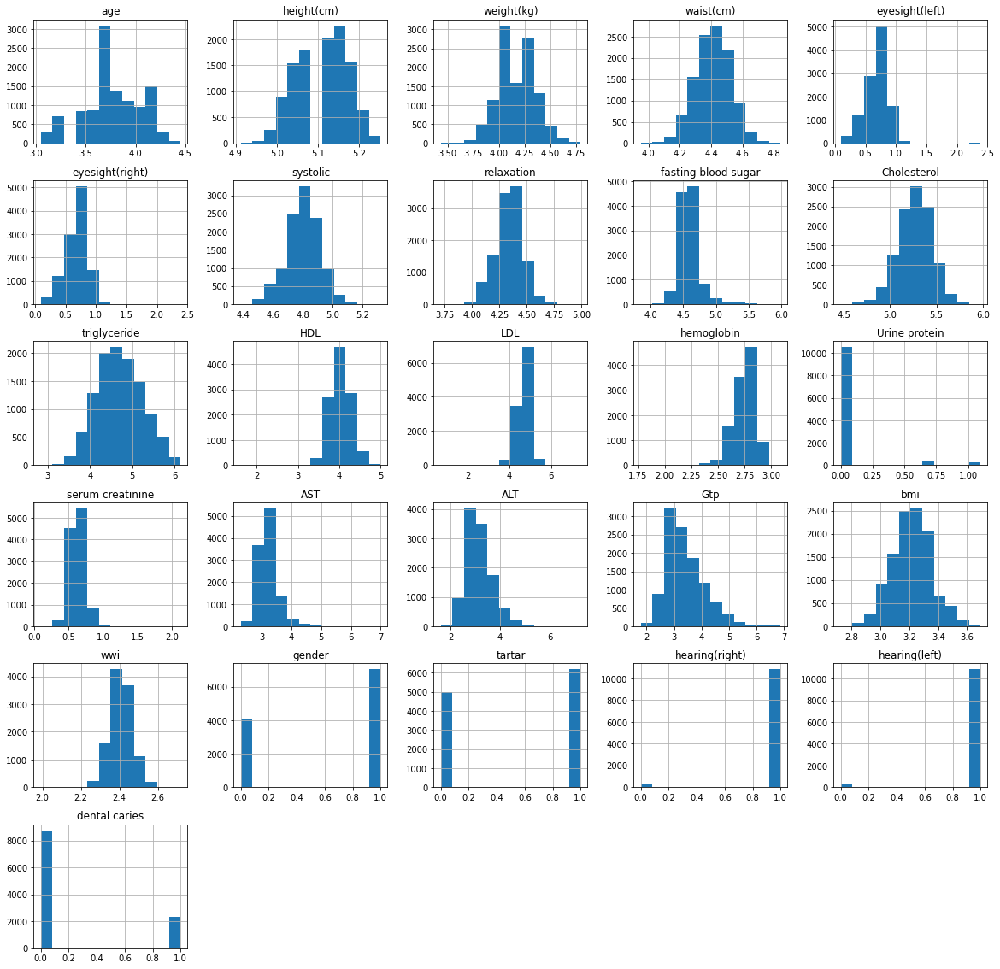

In [126]:
# log_x_test 시각화
log_x_test.hist(figsize = (20, 20), bins = 12, legend=False)

array([[<AxesSubplot: title={'center': 'age'}>,
        <AxesSubplot: title={'center': 'height(cm)'}>,
        <AxesSubplot: title={'center': 'weight(kg)'}>,
        <AxesSubplot: title={'center': 'waist(cm)'}>,
        <AxesSubplot: title={'center': 'eyesight(left)'}>],
       [<AxesSubplot: title={'center': 'eyesight(right)'}>,
        <AxesSubplot: title={'center': 'systolic'}>,
        <AxesSubplot: title={'center': 'relaxation'}>,
        <AxesSubplot: title={'center': 'fasting blood sugar'}>,
        <AxesSubplot: title={'center': 'Cholesterol'}>],
       [<AxesSubplot: title={'center': 'triglyceride'}>,
        <AxesSubplot: title={'center': 'HDL'}>,
        <AxesSubplot: title={'center': 'LDL'}>,
        <AxesSubplot: title={'center': 'hemoglobin'}>,
        <AxesSubplot: title={'center': 'Urine protein'}>],
       [<AxesSubplot: title={'center': 'serum creatinine'}>,
        <AxesSubplot: title={'center': 'AST'}>,
        <AxesSubplot: title={'center': 'ALT'}>,
        <AxesSu

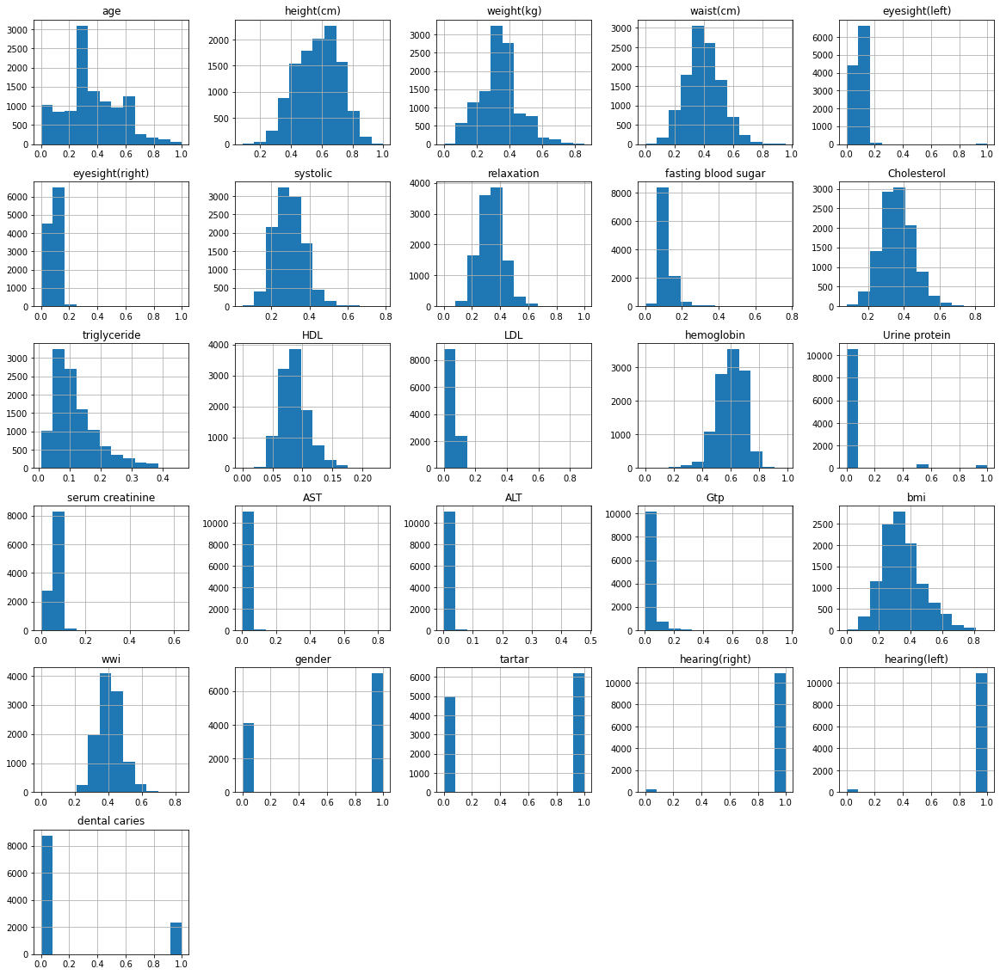

In [127]:
# mmx_x_test 시각화
mmx_x_test.hist(figsize = (20, 20), bins = 12, legend=False)

array([[<AxesSubplot: title={'center': 'age'}>,
        <AxesSubplot: title={'center': 'height(cm)'}>,
        <AxesSubplot: title={'center': 'weight(kg)'}>,
        <AxesSubplot: title={'center': 'waist(cm)'}>,
        <AxesSubplot: title={'center': 'eyesight(left)'}>],
       [<AxesSubplot: title={'center': 'eyesight(right)'}>,
        <AxesSubplot: title={'center': 'systolic'}>,
        <AxesSubplot: title={'center': 'relaxation'}>,
        <AxesSubplot: title={'center': 'fasting blood sugar'}>,
        <AxesSubplot: title={'center': 'Cholesterol'}>],
       [<AxesSubplot: title={'center': 'triglyceride'}>,
        <AxesSubplot: title={'center': 'HDL'}>,
        <AxesSubplot: title={'center': 'LDL'}>,
        <AxesSubplot: title={'center': 'hemoglobin'}>,
        <AxesSubplot: title={'center': 'Urine protein'}>],
       [<AxesSubplot: title={'center': 'serum creatinine'}>,
        <AxesSubplot: title={'center': 'AST'}>,
        <AxesSubplot: title={'center': 'ALT'}>,
        <AxesSu

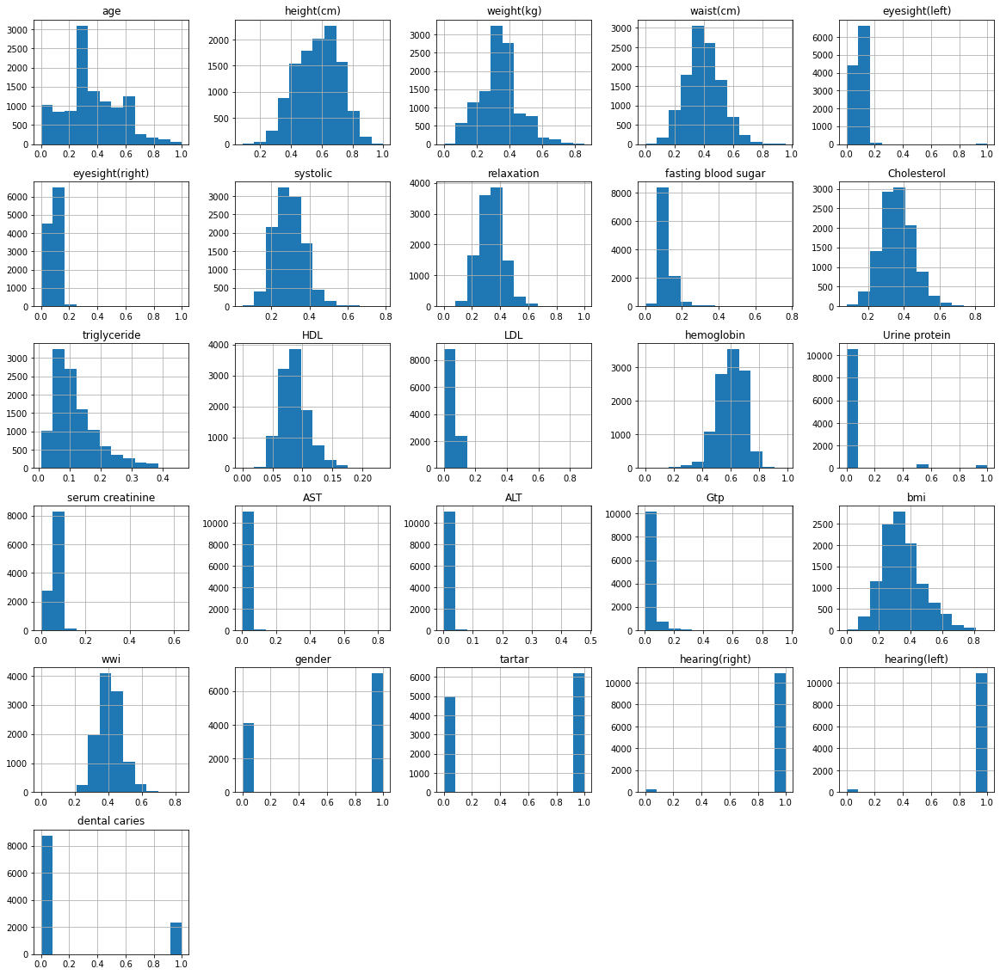

In [128]:
# mmx_x_test 시각화
mmx_x_test.hist(figsize = (20, 20), bins = 12, legend=False)